<a href="https://colab.research.google.com/github/nssazib/USBuildingFootprints/blob/master/solar_panel_testing_all.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Using CLIPSeg with Hugging Face Transformers

Using Hugging Face Transformers, you can easily download and run a pre-trained CLIPSeg model on your images. Let’s start by installing transformers.

In [1]:
pip install earthengine-api

In [2]:
!earthengine authenticate

I0000 00:00:1735826507.703943    1672 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1735826508.634649    1672 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1735826508.635040    1672 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
Authenticate: Limited support in Colab. Use ee.Authenticate() or --auth_mode=notebook instead.
W0102

In [3]:
# Install the Earth Engine Python API (if not already installed)
!pip install earthengine-api -q
!pip install geemap -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 30.3 MB/s eta 0:00:00


In [5]:
import ee
import geemap
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Authenticate and initialize Earth Engine
ee.Authenticate()
ee.Initialize()

# Step 1: Define the boundary for Prince George's County
counties = ee.FeatureCollection('TIGER/2018/Counties')  # US counties dataset
prince_george_boundary = counties.filter(
    ee.Filter.And(
        ee.Filter.eq('STATEFP', '24'),  # Maryland's state FIPS code
        ee.Filter.eq('NAME', "Prince George's")  # County name
    )
)

# Visualize Prince George's County boundary
Map = geemap.Map()
Map.addLayer(prince_george_boundary, {"color": "blue"}, "Prince George's County Boundary")
Map.centerObject(prince_george_boundary, 9)

# Step 2: Load Maryland Structures and filter to Prince George's County
maryland_structures = ee.FeatureCollection('projects/sat-io/open-datasets/ORNL/USA-STRUCTURES/USA_ST_MD') \
                        .filterBounds(prince_george_boundary)

# Step 3: Load NAIP True Color imagery
naip_dataset = ee.ImageCollection('USDA/NAIP/DOQQ') \
                  .filterBounds(prince_george_boundary) \
                  .filterDate('2023-01-01', '2024-12-31') \
                  .select(['R', 'G', 'B'])  # True color bands (Red, Green, Blue)

# Composite NAIP imagery
naip_composite = naip_dataset.median()

# Function to clip NAIP imagery by BUILD_ID
def clip_naip_by_build_id(build_id):
    structure = maryland_structures.filter(ee.Filter.eq('BUILD_ID', build_id)).first()
    if structure is None:
        return None
    structure_geometry = structure.geometry()
    return naip_composite.clip(structure_geometry), structure_geometry

# Function to extract pixel values for the R band
def extract_r_band_pixel_values(clipped_image):
    band_stats = clipped_image.reduceRegion(
        reducer=ee.Reducer.toList(),
        geometry=clipped_image.geometry(),
        scale=1,  # NAIP resolution (1 meter)
        maxPixels=1e13
    ).getInfo()
    return np.array(band_stats['R'])

# Function to perform K-means clustering on the R band
def kmeans_clustering_r_band(r_values, n_clusters=2):
    r_values_reshaped = r_values.reshape(-1, 1)
    scaler = StandardScaler()
    r_values_scaled = scaler.fit_transform(r_values_reshaped)
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    return kmeans.fit_predict(r_values_scaled), kmeans.cluster_centers_

# Function to calculate cluster dominance ratio
def calculate_cluster_ratio(cluster_labels):
    unique_labels, counts = np.unique(cluster_labels, return_counts=True)
    total_pixels = np.sum(counts)
    return np.max(counts) / total_pixels

# Function to classify solar panel presence
def classify_solar_panel(dominance_ratio, threshold=0.7):
    return dominance_ratio < threshold

# Step 4: Process all BUILD_IDs in the county
solar_panel_structures = []  # To store geometries with solar panels
#build_ids = maryland_structures.aggregate_array('BUILD_ID').getInfo()


In [19]:
import ee
import geemap

# Authenticate and initialize Earth Engine
ee.Authenticate()
ee.Initialize()

# Step 1: Define the custom boundary
custom_boundary = ee.Geometry.Polygon([
    [[-76.816576, 38.831585],
     [-76.81245, 38.831585],
     [-76.81245, 38.830255],
     [-76.816576, 38.830255],
     [-76.816576, 38.831585]]
])

# Visualize the custom boundary
Map = geemap.Map()
Map.addLayer(custom_boundary, {"color": "blue"}, "Custom Boundary")
Map.centerObject(custom_boundary, 17)

# Step 2: Load Maryland Structures and filter to the custom boundary
maryland_structures = ee.FeatureCollection('projects/sat-io/open-datasets/ORNL/USA-STRUCTURES/USA_ST_MD') \
    .filterBounds(custom_boundary)

# Visualize the structures
Map.addLayer(maryland_structures, {"color": "green"}, "Maryland Structures")

# Step 3: Load NAIP True Color imagery
naip_dataset = ee.ImageCollection('USDA/NAIP/DOQQ') \
    .filterBounds(custom_boundary) \
    .filterDate('2023-01-01', '2024-12-31') \
    .select(['R', 'G', 'B'])

# Composite NAIP imagery
naip_composite = naip_dataset.median()
Map.addLayer(naip_composite, {"min": 0, "max": 255}, "NAIP True Color")
# Step 4: Function to detect solar panels with debugging
def detect_solar_panels_server_side(structure):
    # Get the geometry of the structure
    geometry = structure.geometry()

    # Clip NAIP composite to the structure geometry
    clipped_image = naip_composite.clip(geometry)

    # Apply K-means segmentation to the clipped image
    kmeans_result = ee.Algorithms.Image.Segmentation.KMeans(
        image=clipped_image.select('R'),  # Use the R band
        numClusters=2
    )

    # Calculate the proportion of pixels in each cluster
    cluster_counts = kmeans_result.reduceRegion(
        reducer=ee.Reducer.frequencyHistogram(),
        geometry=geometry,
        scale=1,  # NAIP resolution (1 meter)
        maxPixels=1e13
    ).get('clusters')

    # Use a default value if no cluster data is available
    cluster_counts = ee.Dictionary(cluster_counts)

    # Calculate total pixels and largest cluster pixel count
    total_pixels = cluster_counts.values().reduce(ee.Reducer.sum())
    largest_cluster = cluster_counts.values().reduce(ee.Reducer.max())

    # Calculate the dominance ratio
    dominance_ratio = ee.Number(largest_cluster).divide(total_pixels)

    # Classify solar panel presence
    has_solar_panel = dominance_ratio.lt(0.7)  # Adjust threshold as needed

    # Set properties for debugging
    return structure.set({
        "hasSolarPanel": has_solar_panel,
        "dominanceRatio": dominance_ratio,
        "totalPixels": total_pixels,
        "largestClusterPixels": largest_cluster
    })

# Step 5: Apply the solar panel detection to all structures
solar_panel_results = maryland_structures.map(detect_solar_panels_server_side)

# Step 6: Filter structures with detected solar panels
structures_with_solar_panels = solar_panel_results.filter(
    ee.Filter.eq("hasSolarPanel", True)
)

# Visualize detected solar panels
Map.addLayer(structures_with_solar_panels, {"color": "red"}, "Solar Panels Detected")

# Display the map
Map


Map(center=[38.83092001615303, -76.81451299996499], controls=(WidgetControl(options=['position', 'transparent_…

In [20]:
import geemap

# Export results to GeoJSON
output_geojson = "solar_panel_results.geojson"
geemap.ee_to_geojson(solar_panel_results, filename=output_geojson)

print(f"GeoJSON file created: {output_geojson}")

GeoJSON file created: solar_panel_results.geojson


In [21]:
# prompt: read the geokson ang print resuts

import json

# Assuming 'solar_panel_results.geojson' exists in the current directory
try:
    with open('solar_panel_results.geojson', 'r') as f:
        geojson_data = json.load(f)
        print(json.dumps(geojson_data, indent=2)) # Print with indentation for readability

except FileNotFoundError:
    print("Error: 'solar_panel_results.geojson' not found.  Make sure to run the previous code to generate this file.")

{
  "type": "FeatureCollection",
  "columns": {
    "BUILD_ID": "Long",
    "CENSUSCODE": "String",
    "FIPS": "String",
    "HEIGHT": "Float",
    "H_ADJ_ELEV": "Float",
    "IMAGE_DATE": "Long",
    "IMAGE_NAME": "String",
    "LATITUDE": "Float",
    "LONGITUDE": "Float",
    "L_ADJ_ELEV": "Float",
    "OCC_CLS": "String",
    "OUTBLDG": "String",
    "PRIM_OCC": "String",
    "PROD_DATE": "Long",
    "PROP_ADDR": "String",
    "PROP_CITY": "String",
    "PROP_ST": "String",
    "PROP_ZIP": "String",
    "REMARKS": "String",
    "SEC_OCC": "String",
    "SOURCE": "String",
    "SQFEET": "Float",
    "SQMETERS": "Float",
    "STATE_FIPS": "String",
    "Shape__Are": "Float",
    "Shape__Len": "Float",
    "USNG": "String",
    "UUID": "String",
    "VAL_METHOD": "String",
    "dominanceRatio": "Number",
    "hasSolarPanel": "Number",
    "largestClusterPixels": "Object",
    "system:index": "String",
    "totalPixels": "Object"
  },
  "version": 1669049256806132,
  "id": "projects/s

In [24]:
import folium
import geemap
import geopandas as gpd

# Step 1: Export Earth Engine results to GeoJSON
output_geojson = "solar_panel_results.geojson"
geemap.ee_to_geojson(solar_panel_results, filename=output_geojson)

# Step 2: Load GeoJSON into GeoPandas
gdf = gpd.read_file(output_geojson)

# Step 3: Create a folium map
m = folium.Map(location=[38.831, -76.814], zoom_start=16)

# Step 4: Add GeoJSON to the map with styling based on `hasSolarPanel`
def style_function(feature):
    has_solar_panel = feature["properties"]["hasSolarPanel"]
    return {
        "fillColor": "red" if has_solar_panel else "green",
        "color": "black",
        "weight": 2,
        "fillOpacity": 0.6,
    }

folium.GeoJson(
    gdf,
    style_function=style_function,
    tooltip=folium.GeoJsonTooltip(fields=["UUID", "SQFEET", "hasSolarPanel"]),
).add_to(m)

# Display the map
m.save("solar_panel_map.html")
print("Map saved as solar_panel_map.html")


Map saved as solar_panel_map.html


In [26]:
import folium
import geemap
import geopandas as gpd

# Step 1: Export Earth Engine results to GeoJSON
output_geojson = "solar_panel_results.geojson"
geemap.ee_to_geojson(solar_panel_results, filename=output_geojson)

# Step 2: Load GeoJSON into GeoPandas
gdf = gpd.read_file(output_geojson)

# Step 3: Keep only the required fields
fields_to_keep = [
    "hasSolarPanel",
    "dominanceRatio",
    "totalPixels",
    "largestClusterPixels",
    "BUILD_ID",  # Adjust the key name if it differs in the dataset
    "geometry"  # Include geometry for mapping
]
gdf = gdf[fields_to_keep]

# Step 4: Create a folium map
m = folium.Map(location=[38.831, -76.814], zoom_start=16)

# Step 5: Add GeoJSON to the map with selected properties in the tooltip
def style_function(feature):
    has_solar_panel = feature["properties"]["hasSolarPanel"]
    return {
        "fillColor": "red" if has_solar_panel else "green",
        "color": "black",
        "weight": 2,
        "fillOpacity": 0.6,
    }

folium.GeoJson(
    gdf,
    style_function=style_function,
    tooltip=folium.GeoJsonTooltip(
        fields=["BUILD_ID", "hasSolarPanel", "dominanceRatio", "totalPixels", "largestClusterPixels"],
        aliases=["Build ID", "Solar Panel Detected", "Dominance Ratio", "Total Pixels", "Largest Cluster Pixels"],
    ),
).add_to(m)

# Step 6: Save and display the map
m.save("solar_panel_map_filtered.html")
print("Map saved as solar_panel_map_filtered.html")


Map saved as solar_panel_map_filtered.html


In [23]:
# prompt: vie the geojson in the map with has solar panel value

import json
import geemap

# Assuming 'solar_panel_results.geojson' exists in the current directory
try:
    with open('solar_panel_results.geojson', 'r') as f:
        geojson_data = json.load(f)

        # Now you have the geojson data loaded in 'geojson_data'.
        # Create a map and add the geojson layer:
        Map = geemap.Map()
        Map.add_geojson(geojson_data, layer_name="Solar Panel Results")
        Map

except FileNotFoundError:
    print("Error: 'solar_panel_results.geojson' not found.  Make sure to run the previous code to generate this file.")

In [29]:
import ee
import geemap
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Authenticate and initialize Earth Engine
ee.Authenticate()
ee.Initialize()

# Step 1: Define the custom boundary
custom_boundary = ee.Geometry.Polygon([
    [[-76.816576, 38.831585],
     [-76.81245, 38.831585],
     [-76.81245, 38.830255],
     [-76.816576, 38.830255],
     [-76.816576, 38.831585]]
])

# Visualize the custom boundary
Map = geemap.Map()
Map.addLayer(custom_boundary, {"color": "blue"}, "Custom Boundary")
Map.centerObject(custom_boundary, 17)

# Step 2: Load Maryland Structures and filter to the custom boundary
maryland_structures = ee.FeatureCollection('projects/sat-io/open-datasets/ORNL/USA-STRUCTURES/USA_ST_MD') \
    .filterBounds(custom_boundary)

# Visualize the structures
Map.addLayer(maryland_structures, {"color": "green"}, "Maryland Structures")

# Step 3: Load NAIP True Color imagery
naip_dataset = ee.ImageCollection('USDA/NAIP/DOQQ') \
    .filterBounds(custom_boundary) \
    .filterDate('2023-01-01', '2024-12-31') \
    .select(['R', 'G', 'B'])

# Composite NAIP imagery
naip_composite = naip_dataset.median()
Map.addLayer(naip_composite, {"min": 0, "max": 255}, "NAIP True Color")

# Step 4: Function to extract pixel values for clustering
def extract_pixel_values(structure):
    geometry = structure.geometry()
    clipped_image = naip_composite.clip(geometry)
    pixel_values = clipped_image.reduceRegion(
        reducer=ee.Reducer.toList(),
        geometry=geometry,
        scale=1,  # NAIP resolution (1 meter)
        maxPixels=1e13
    ).get("R")
    return pixel_values.getInfo()

# Step 5: Function to detect solar panels using sklearn KMeans
def detect_solar_panels_with_kmeans(pixel_values, n_clusters=2, threshold=0.7):
    if not pixel_values:
        return None, None

    # Prepare data for clustering
    pixel_values = np.array(pixel_values).reshape(-1, 1)
    scaler = StandardScaler()
    scaled_values = scaler.fit_transform(pixel_values)

    # Perform K-means clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(scaled_values)

    # Calculate cluster dominance
    unique, counts = np.unique(labels, return_counts=True)
    print(counts)
    cluster_ratios = counts / counts.sum()
    dominance_ratio = cluster_ratios.max()

    # Determine solar panel presence
    has_solar_panel = dominance_ratio > threshold
    return has_solar_panel, dominance_ratio

# Step 6: Apply solar panel detection to all structures
results = []
for feature in maryland_structures.getInfo()["features"]:
    properties = feature["properties"]
    build_id = properties.get("BUILD_ID", "Unknown")
    geometry = feature["geometry"]

    try:
        pixel_values = extract_pixel_values(ee.Feature(feature))
        has_solar_panel, dominance_ratio = detect_solar_panels_with_kmeans(pixel_values)

        if has_solar_panel is not None:
            results.append({
                "BUILD_ID": build_id,
                "hasSolarPanel": int(has_solar_panel),
                "dominanceRatio": dominance_ratio,
                "geometry": geometry
            })
    except Exception as e:
        print(f"Error processing BUILD_ID {build_id}: {e}")

# Step 7: Convert results to a pandas DataFrame
df = pd.DataFrame(results)

# Save results to a CSV file
output_csv = "solar_panel_results_kmeans.csv"
df.to_csv(output_csv, index=False)
print(f"Results saved to {output_csv}")
import folium

# Step 8: Visualize results on the map using folium
m = folium.Map(location=[38.831, -76.814], zoom_start=16)

for result in results:
    geometry = result["geometry"]
    has_solar_panel = result["hasSolarPanel"]
    color = "red" if has_solar_panel else "green"
    folium.GeoJson(
        geometry,
        style_function=lambda x, color=color: {
            "fillColor": color,
            "color": "black",
            "weight": 1,
            "fillOpacity": 0.6,
        },
        tooltip=f"BUILD_ID: {result['BUILD_ID']}<br>Dominance Ratio: {result['dominanceRatio']:.2f}<br>Has Solar Panel: {has_solar_panel}"
    ).add_to(m)

# Save the map to an HTML file
m.save("solar_panel_map_kmeans.html")
print("Map saved as solar_panel_map_kmeans.html")



Results saved to solar_panel_results_kmeans.csv
Map saved as solar_panel_map_kmeans.html


In [41]:
import ee
import geemap
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Authenticate and initialize Earth Engine
ee.Authenticate()
ee.Initialize()

# Step 1: Define the custom boundary
custom_boundary = ee.Geometry.Polygon([
    [[-76.816576, 38.831585],
     [-76.81245, 38.831585],
     [-76.81245, 38.830255],
     [-76.816576, 38.830255],
     [-76.816576, 38.831585]]
])

# Step 2: Load Maryland Structures and filter to the custom boundary
maryland_structures = ee.FeatureCollection('projects/sat-io/open-datasets/ORNL/USA-STRUCTURES/USA_ST_MD') \
    .filterBounds(custom_boundary)

# Load NAIP True Color imagery
naip_dataset = ee.ImageCollection('USDA/NAIP/DOQQ') \
    .filterBounds(custom_boundary) \
    .filterDate('2023-01-01', '2024-12-31') \
    .select(['R', 'G', 'B'])

# Composite NAIP imagery
naip_composite = naip_dataset.median()

# Step 3: Function to extract pixel values for clustering
def extract_pixel_values(structure):
    geometry = structure.geometry()
    clipped_image = naip_composite.clip(geometry)
    pixel_values = clipped_image.reduceRegion(
        reducer=ee.Reducer.toList(),
        geometry=geometry,
        scale=1,  # NAIP resolution (1 meter)
        maxPixels=1e13
    ).get("G")  # Extract green band
    return pixel_values.getInfo()

# Step 4: Function to detect solar panels using KMeans
def detect_solar_panels_with_kmeans(pixel_values, n_clusters=2, threshold=0.7):
    if not pixel_values:
        return None, None

    # Prepare data for clustering
    pixel_values = np.array(pixel_values).reshape(-1, 1)
    scaler = StandardScaler()
    scaled_values = scaler.fit_transform(pixel_values)

    # Perform K-means clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(scaled_values)

    # Calculate cluster dominance
    unique, counts = np.unique(labels, return_counts=True)
    print("Cluster Counts:", counts)
    cluster_ratios = counts / counts.sum()
    print("Cluster Ratios:", cluster_ratios)
    dominance_ratio = cluster_ratios.max()

    # Determine solar panel presence
    has_solar_panel = dominance_ratio < threshold
    return has_solar_panel, dominance_ratio

# Define the specific BUILD_ID to debug
debug_build_id = 898587  # Replace with the actual BUILD_ID

# Step 5: Filter the structure by BUILD_ID
debug_structure = maryland_structures.filter(ee.Filter.eq("BUILD_ID", debug_build_id)).first()

# Create a geemap map
Map = geemap.Map()

if debug_structure:
    try:
        # Step 6: Extract pixel values
        pixel_values = extract_pixel_values(debug_structure)
        print(f"Pixel values for BUILD_ID {debug_build_id}:", pixel_values)

        # Step 7: Apply KMeans clustering
        has_solar_panel, dominance_ratio = detect_solar_panels_with_kmeans(pixel_values)
        print(f"Results for BUILD_ID {debug_build_id}:")
        print(f"  - Has Solar Panel: {has_solar_panel}")
        print(f"  - Dominance Ratio: {dominance_ratio}")

        # Add NAIP imagery to the map
        Map.addLayer(naip_composite, {"bands": ["R", "G", "B"], "min": 0, "max": 255}, "NAIP True Color")

        # Add the debug structure geometry
        geometry = debug_structure.geometry()
        Map.addLayer(geometry, {"color": "red"}, f"Geometry of BUILD_ID {debug_build_id}")

        # Show geometry coordinates in the console
        geometry_info = geometry.getInfo()
        print(f"Geometry for BUILD_ID {debug_build_id}:", geometry_info)

        # Center the map on the debug structure
        Map.centerObject(debug_structure, 18)

    except Exception as e:
        print(f"Error processing BUILD_ID {debug_build_id}: {e}")
else:
    print(f"BUILD_ID {debug_build_id} not found in the dataset.")

# Display the map
Map


Pixel values for BUILD_ID 898587: [74, 74, 80, 72, 73, 73, 77, 55, 82, 90, 71, 74, 73, 72, 80, 85, 85, 109, 107, 84, 70, 74, 74, 72, 73, 75, 84, 77, 76, 88, 90, 107, 113, 102, 75, 74, 73, 73, 73, 64, 105, 142, 83, 83, 88, 90, 109, 113, 115, 102, 70, 72, 73, 70, 77, 78, 85, 84, 136, 106, 104, 90, 92, 97, 113, 115, 114, 112, 102, 102, 92, 97, 74, 76, 73, 69, 49, 72, 69, 54, 63, 92, 86, 96, 94, 97, 94, 105, 114, 114, 109, 102, 103, 112, 101, 154, 96, 74, 70, 89, 89, 60, 82, 91, 79, 87, 92, 93, 93, 94, 96, 95, 115, 112, 102, 104, 106, 106, 138, 208, 79, 149, 90, 70, 79, 88, 106, 96, 91, 92, 94, 94, 95, 95, 95, 94, 93, 105, 113, 113, 113, 115, 114, 115, 91, 73, 104, 93, 112, 98, 94, 93, 95, 95, 95, 95, 96, 96, 95, 95, 96, 93, 97, 115, 114, 113, 113, 113, 107, 67, 63, 84, 60, 53, 75, 96, 92, 94, 95, 95, 94, 95, 95, 96, 96, 95, 93, 106, 113, 112, 113, 115, 62, 63, 54, 78, 94, 61, 49, 91, 94, 94, 94, 94, 94, 95, 95, 94, 95, 95, 95, 99, 113, 114, 114, 115, 115, 54, 52, 54, 69, 85, 50, 46, 79, 9

Map(center=[38.83019537430748, -76.8140484736959], controls=(WidgetControl(options=['position', 'transparent_b…

In [ ]:
!pip install torch transformers pillow matplotlib requests


In [6]:
print(maryland_structures)

ee.FeatureCollection({
  "functionInvocationValue": {
    "functionName": "Collection.filter",
    "arguments": {
      "collection": {
        "functionInvocationValue": {
          "functionName": "Collection.loadTable",
          "arguments": {
            "tableId": {
              "constantValue": "projects/sat-io/open-datasets/ORNL/USA-STRUCTURES/USA_ST_MD"
            }
          }
        }
      },
      "filter": {
        "functionInvocationValue": {
          "functionName": "Filter.intersects",
          "arguments": {
            "leftField": {
              "constantValue": ".all"
            },
            "rightValue": {
              "functionInvocationValue": {
                "functionName": "Feature",
                "arguments": {
                  "geometry": {
                    "functionInvocationValue": {
                      "functionName": "Collection.geometry",
                      "arguments": {
                        "collection": {
                  

In [ ]:
print(len(build_ids))

In [ ]:

for build_id in build_ids:
    try:
        clipped_image, structure_geometry = clip_naip_by_build_id(build_id)
        if clipped_image is None:
            continue

        # Extract R band pixel values
        r_values = extract_r_band_pixel_values(clipped_image)
        if len(r_values) == 0:
            continue

        # Perform K-means clustering and calculate cluster dominance ratio
        cluster_labels, _ = kmeans_clustering_r_band(r_values, n_clusters=2)
        dominance_ratio = calculate_cluster_ratio(cluster_labels)

        # Check if the structure has a solar panel
        if classify_solar_panel(dominance_ratio, threshold=0.7):
            solar_panel_structures.append(structure_geometry)

    except Exception as e:
        print(f"Error processing BUILD_ID {build_id}: {e}")

# Step 5: Visualize structures with solar panels on the map
for geometry in solar_panel_structures:
    Map.addLayer(geometry, {"color": "red"}, "Solar Panels Detected")

# Display the map
Map


In [ ]:


# Import required libraries
import ee
import geemap
import geopandas as gpd
import os
from google.colab import files

# Authenticate and initialize Earth Engine
ee.Authenticate()
ee.Initialize()

# Step 1: Define the boundary
boundary = ee.Geometry.Polygon([
    [[-76.694437, 39.051973], [-76.690928, 39.051973],
     [-76.690928, 39.05091], [-76.694437, 39.05091],
     [-76.694437, 39.051973]]
])

# Load the boundary and visualize
Map = geemap.Map()
Map.addLayer(boundary, {"color": "blue"}, "Boundary")
Map.centerObject(boundary, 16)

# Step 2: Load Maryland Structures and filter to boundary
maryland_structures = ee.FeatureCollection('projects/sat-io/open-datasets/ORNL/USA-STRUCTURES/USA_ST_MD') \
                        # .filterBounds(boundary)

# Step 3: Create and export shapefile of clipped structures
shapefile_path = 'maryland_structures.shp'
geemap.ee_to_shp(maryland_structures, filename=shapefile_path)
print(f"Shapefile created: {shapefile_path}")

# Step 4: Load NAIP True Color imagery
naip_dataset = ee.ImageCollection('USDA/NAIP/DOQQ') \
                  .filterBounds(boundary) \
                  .filterDate('2023-01-01', '2024-12-31') \
                  .select(['R', 'G', 'B'])  # True color bands (Red, Green, Blue)

# Composite NAIP imagery for the boundary
naip_composite = naip_dataset.median().clip(boundary)
Map.addLayer(naip_composite, {"min": 0, "max": 255}, "NAIP True Color")

# Step 5: Display the shapefile and NAIP imagery
gdf = gpd.read_file(shapefile_path)
Map.add_gdf(gdf, layer_name="Maryland Structures")
Map



Shapefile created: maryland_structures.shp


Map(center=[39.05144151232197, -76.69268250009497], controls=(WidgetControl(options=['position', 'transparent_…

In [8]:
import ee
import geemap

# Step 1: Initialize Earth Engine
ee.Initialize()

# Step 2: Load the Counties dataset and filter for Prince George's County
counties = ee.FeatureCollection('TIGER/2018/Counties')  # US counties dataset
prince_george_boundary = counties.filter(
    ee.Filter.And(
        ee.Filter.eq('STATEFP', '24'),  # Maryland's state FIPS code
        ee.Filter.eq('NAME', "Prince George's")  # County name
    )
)

# Visualize the Prince George's County boundary
Map = geemap.Map()
Map.addLayer(prince_george_boundary, {"color": "blue"}, "Prince George's County Boundary")
Map.centerObject(prince_george_boundary, 9)

# Step 3: Load Structures dataset and filter to Prince George's County
maryland_structures = ee.FeatureCollection('projects/sat-io/open-datasets/ORNL/USA-STRUCTURES/USA_ST_MD') \
                        .filterBounds(prince_george_boundary)

# Add structures to the map for visualization
Map.addLayer(maryland_structures, {"color": "red"}, "Prince George's County Structures")

# Step 4: Load NAIP True Color imagery and filter to Prince George's County
naip_dataset = ee.ImageCollection('USDA/NAIP/DOQQ') \
                  .filterBounds(prince_george_boundary) \
                  .filterDate('2023-01-01', '2024-12-31') \
                  .select(['R', 'G', 'B'])  # True color bands (Red, Green, Blue)

# Composite NAIP imagery for Prince George's County
naip_composite = naip_dataset.median().clip(prince_george_boundary)
Map.addLayer(naip_composite, {"min": 0, "max": 255}, "NAIP True Color")

# Step 5: Display the map
Map


Map(center=[38.82930291018123, -76.84728090022855], controls=(WidgetControl(options=['position', 'transparent_…

In [10]:
maryland_structures.aggregate_array('BUILD_ID').getInfo()

KeyboardInterrupt: 

NAIP imagery clipped for BUILD_ID: 7362659
Clipped NAIP image added to the map and zoomed.


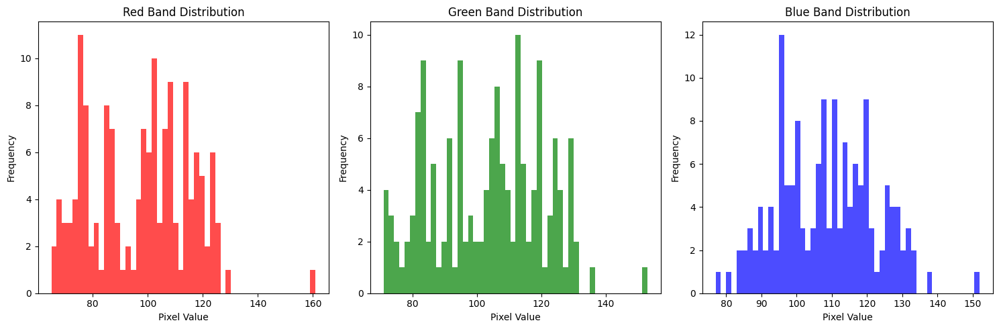

Map(center=[39.05122952495774, -76.69360244805536], controls=(WidgetControl(options=['position', 'transparent_…

In [ ]:
# Import required libraries
import ee
import geemap
import matplotlib.pyplot as plt
import numpy as np


# Step 1: Define the boundary
boundary = ee.Geometry.Polygon([
    [[-76.694437, 39.051973], [-76.690928, 39.051973],
     [-76.690928, 39.05091], [-76.694437, 39.05091],
     [-76.694437, 39.051973]]
])

# Load the boundary and visualize
Map = geemap.Map()
Map.addLayer(boundary, {"color": "blue"}, "Boundary")
Map.centerObject(boundary, 16)

# Step 2: Load Maryland Structures and filter to boundary
maryland_structures = ee.FeatureCollection('projects/sat-io/open-datasets/ORNL/USA-STRUCTURES/USA_ST_MD') \
                         .filterBounds(boundary)

# Step 3: Load NAIP True Color imagery
naip_dataset = ee.ImageCollection('USDA/NAIP/DOQQ') \
                  .filterBounds(boundary) \
                  .filterDate('2023-01-01', '2024-12-31') \
                  .select(['R', 'G', 'B'])  # True color bands (Red, Green, Blue)

# Composite NAIP imagery for the boundary
naip_composite = naip_dataset.median()

# Add NAIP True Color to the map
Map.addLayer(naip_composite, {"min": 0, "max": 255}, "NAIP True Color")


# Function to clip NAIP imagery by Maryland structure BUILD_ID
def clip_naip_by_build_id(build_id):
    """
    Clips the NAIP composite imagery for a given Maryland structure BUILD_ID
    and highlights the boundary as a red line.
    """
    # Filter the structure by BUILD_ID
    structure = maryland_structures.filter(ee.Filter.eq('BUILD_ID', build_id)).first()

    # If structure is not found, raise an error
    if structure is None:
        print(f"No structure found with BUILD_ID: {build_id}")
        return None

    # Get the structure's geometry
    structure_geometry = structure.geometry()

    # Add the structure boundary as a red line
    Map.addLayer(structure_geometry, {"color": "red", "width": 2}, f"Boundary for BUILD_ID: {build_id}")

    # Clip the NAIP composite to the structure's geometry
    clipped_image = naip_composite.clip(structure_geometry)
    print(f"NAIP imagery clipped for BUILD_ID: {build_id}")
    return clipped_image, structure_geometry


# Function to visualize the clipped image
def visualize_clipped_image(clipped_image, geometry):
    """
    Visualizes the clipped NAIP image with true-color bands (R, G, B).
    """
    Map.addLayer(clipped_image, {"min": 0, "max": 255}, "Clipped NAIP Image")
    Map.centerObject(geometry, 18)  # Automatically zoom into the structure geometry
    print("Clipped NAIP image added to the map and zoomed.")


# Function to generate histograms for R, G, and B bands
def generate_histograms(clipped_image):
    """
    Generates histograms for the R, G, and B bands of the clipped NAIP image.
    """
    # Reduce the image to get pixel values as a list for each band
    band_stats = clipped_image.reduceRegion(
        reducer=ee.Reducer.toList(),
        geometry=clipped_image.geometry(),
        scale=1,  # NAIP resolution (1 meter)
        maxPixels=1e13
    ).getInfo()

    # Extract pixel values for each band
    r_values = np.array(band_stats['R'])
    g_values = np.array(band_stats['G'])
    b_values = np.array(band_stats['B'])

    # Plot histograms
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].hist(r_values, bins=50, color='red', alpha=0.7)
    axes[0].set_title('Red Band Distribution')
    axes[0].set_xlabel('Pixel Value')
    axes[0].set_ylabel('Frequency')

    axes[1].hist(g_values, bins=50, color='green', alpha=0.7)
    axes[1].set_title('Green Band Distribution')
    axes[1].set_xlabel('Pixel Value')
    axes[1].set_ylabel('Frequency')

    axes[2].hist(b_values, bins=50, color='blue', alpha=0.7)
    axes[2].set_title('Blue Band Distribution')
    axes[2].set_xlabel('Pixel Value')
    axes[2].set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()


# Example Usage
build_id = 7362659 # Replace with an actual BUILD_ID from the dataset
clipped_image, structure_geometry = clip_naip_by_build_id(build_id)

if clipped_image:
    visualize_clipped_image(clipped_image, structure_geometry)
    generate_histograms(clipped_image)

# Display the map
Map


NAIP imagery clipped for BUILD_ID: 7362659
Clipped NAIP image added to the map and zoomed.


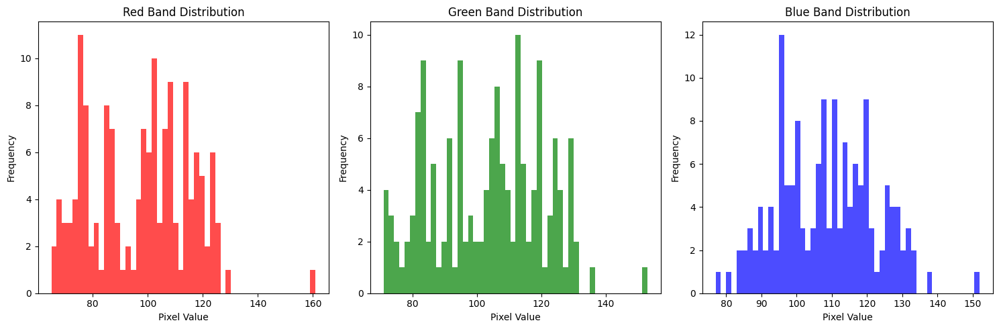

Map(bottom=25635617.0, center=[39.05122952495774, -76.69360244805536], controls=(WidgetControl(options=['posit…

In [ ]:
# Example Usage
build_id =  7362659  # Replace with an actual BUILD_ID from the dataset
clipped_image, structure_geometry = clip_naip_by_build_id(build_id)

if clipped_image:
    visualize_clipped_image(clipped_image, structure_geometry)
    generate_histograms(clipped_image)

# Display the map
Map

NAIP imagery clipped for BUILD_ID: 7362659

Cluster Statistics:
Cluster 0: 57 pixels
Cluster 1: 37 pixels
Cluster 2: 56 pixels


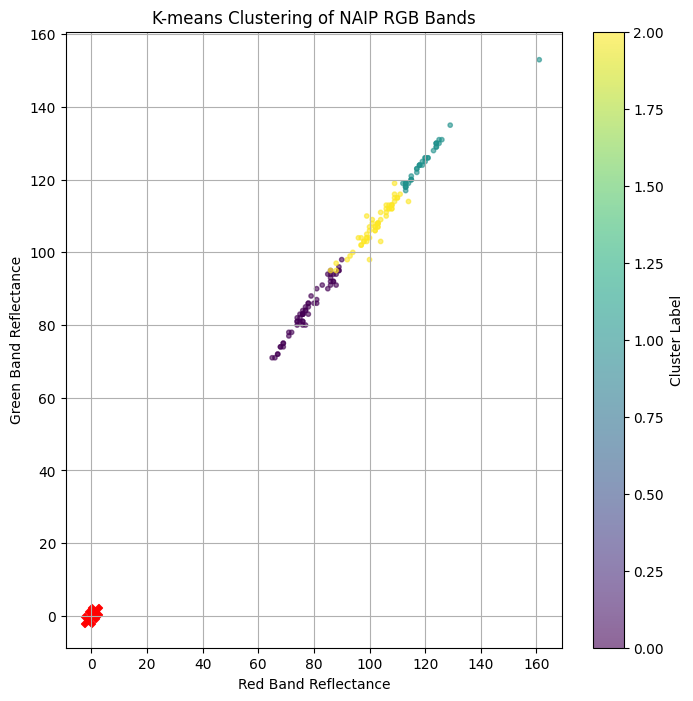


Cluster Centers (R, G, B):
Cluster 0: [-1.07588897 -1.0761563  -1.00101164]
Cluster 1: [1.24757195 1.26275179 1.29999069]
Cluster 2: [0.27081266 0.26105524 0.15996443]


In [ ]:
# Import required libraries
import ee
import geemap
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler



# Step 1: Define the boundary
boundary = ee.Geometry.Polygon([
    [[-76.694437, 39.051973], [-76.690928, 39.051973],
     [-76.690928, 39.05091], [-76.694437, 39.05091],
     [-76.694437, 39.051973]]
])

# Load the boundary and visualize
Map = geemap.Map()
Map.addLayer(boundary, {"color": "blue"}, "Boundary")
Map.centerObject(boundary, 16)

# Step 2: Load Maryland Structures and filter to boundary
maryland_structures = ee.FeatureCollection('projects/sat-io/open-datasets/ORNL/USA-STRUCTURES/USA_ST_MD') \
                         .filterBounds(boundary)

# Step 3: Load NAIP True Color imagery
naip_dataset = ee.ImageCollection('USDA/NAIP/DOQQ') \
                  .filterBounds(boundary) \
                  .filterDate('2023-01-01', '2024-12-31') \
                  .select(['R', 'G', 'B'])  # True color bands (Red, Green, Blue)

# Composite NAIP imagery for the boundary
naip_composite = naip_dataset.median()

# Add NAIP True Color to the map
Map.addLayer(naip_composite, {"min": 0, "max": 255}, "NAIP True Color")


# Function to clip NAIP imagery by Maryland structure BUILD_ID
def clip_naip_by_build_id(build_id):
    """
    Clips the NAIP composite imagery for a given Maryland structure BUILD_ID.
    """
    # Filter the structure by BUILD_ID
    structure = maryland_structures.filter(ee.Filter.eq('BUILD_ID', build_id)).first()

    # If structure is not found, raise an error
    if structure is None:
        print(f"No structure found with BUILD_ID: {build_id}")
        return None

    # Get the structure's geometry
    structure_geometry = structure.geometry()

    # Clip the NAIP composite to the structure's geometry
    clipped_image = naip_composite.clip(structure_geometry)
    print(f"NAIP imagery clipped for BUILD_ID: {build_id}")
    return clipped_image


# Function to extract pixel values for R, G, and B bands
def extract_pixel_values(clipped_image):
    """
    Extracts pixel values for the R, G, and B bands as NumPy arrays.
    """
    # Reduce the image to get pixel values as a list for each band
    band_stats = clipped_image.reduceRegion(
        reducer=ee.Reducer.toList(),
        geometry=clipped_image.geometry(),
        scale=1,  # NAIP resolution (1 meter)
        maxPixels=1e13
    ).getInfo()

    # Extract pixel values for each band
    r_values = np.array(band_stats['R'])
    g_values = np.array(band_stats['G'])
    b_values = np.array(band_stats['B'])

    return np.stack([r_values, g_values, b_values], axis=1)


# Function to perform K-means clustering
def kmeans_clustering(pixel_values, n_clusters=3):
    """
    Performs K-means clustering on the R, G, and B pixel values.
    """
    # Standardize the data
    scaler = StandardScaler()
    pixel_values_scaled = scaler.fit_transform(pixel_values)

    # Apply K-means clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(pixel_values_scaled)

    return cluster_labels, kmeans.cluster_centers_


# Function to visualize clustering results
def visualize_clusters(cluster_labels, pixel_values, cluster_centers):
    """
    Visualizes the K-means clustering results and outputs cluster pixel counts.
    """
    # Count pixels in each cluster
    unique_labels, counts = np.unique(cluster_labels, return_counts=True)

    # Print cluster statistics
    print("\nCluster Statistics:")
    for label, count in zip(unique_labels, counts):
        print(f"Cluster {label}: {count} pixels")

    # Scatter plot of clusters
    plt.figure(figsize=(8, 8))
    scatter = plt.scatter(
        pixel_values[:, 0], pixel_values[:, 1], c=cluster_labels, cmap='viridis', s=10, alpha=0.6
    )
    plt.scatter(cluster_centers[:, 0], cluster_centers[:, 1], c='red', s=100, marker='X')  # Cluster centers
    plt.colorbar(scatter, label='Cluster Label')
    plt.title('K-means Clustering of NAIP RGB Bands')
    plt.xlabel('Red Band Reflectance')
    plt.ylabel('Green Band Reflectance')
    plt.grid(True)
    plt.show()

    return unique_labels, counts


# Example Usage
build_id = 7362659  # Replace with an actual BUILD_ID from the dataset
clipped_image = clip_naip_by_build_id(build_id)

if clipped_image:
    # Extract pixel values
    pixel_values = extract_pixel_values(clipped_image)

    # Perform K-means clustering
    cluster_labels, cluster_centers = kmeans_clustering(pixel_values, n_clusters=3)

    # Visualize the clustering results and get pixel counts
    unique_labels, counts = visualize_clusters(cluster_labels, pixel_values, cluster_centers)

    print("\nCluster Centers (R, G, B):")
    for i, center in enumerate(cluster_centers):
        print(f"Cluster {i}: {center}")


In [ ]:
# Import required libraries
import ee
import geemap
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler


# Step 1: Define the boundary
boundary = ee.Geometry.Polygon([
    [[-76.694437, 39.051973], [-76.690928, 39.051973],
     [-76.690928, 39.05091], [-76.694437, 39.05091],
     [-76.694437, 39.051973]]
])

# Load the boundary and visualize
Map = geemap.Map()
Map.addLayer(boundary, {"color": "blue"}, "Boundary")
Map.centerObject(boundary, 16)

# Step 2: Load Maryland Structures and filter to boundary
maryland_structures = ee.FeatureCollection('projects/sat-io/open-datasets/ORNL/USA-STRUCTURES/USA_ST_MD') \
                         .filterBounds(boundary)

# Step 3: Load NAIP True Color imagery
naip_dataset = ee.ImageCollection('USDA/NAIP/DOQQ') \
                  .filterBounds(boundary) \
                  .filterDate('2023-01-01', '2024-12-31') \
                  .select(['R', 'G', 'B'])  # True color bands (Red, Green, Blue)

# Composite NAIP imagery for the boundary
naip_composite = naip_dataset.median()

# Add NAIP True Color to the map
Map.addLayer(naip_composite, {"min": 0, "max": 255}, "NAIP True Color")


# Function to clip NAIP imagery by Maryland structure BUILD_ID
def clip_naip_by_build_id(build_id):
    """
    Clips the NAIP composite imagery for a given Maryland structure BUILD_ID
    and highlights the structure boundary.
    """
    # Filter the structure by BUILD_ID
    structure = maryland_structures.filter(ee.Filter.eq('BUILD_ID', build_id)).first()

    # If structure is not found, raise an error
    if structure is None:
        print(f"No structure found with BUILD_ID: {build_id}")
        return None

    # Get the structure's geometry
    structure_geometry = structure.geometry()

    # Highlight the structure boundary in red
    Map.addLayer(structure_geometry, {"color": "red", "width": 2}, f"Boundary for BUILD_ID: {build_id}")

    # Zoom to the structure
    Map.centerObject(structure_geometry, 18)

    # Clip the NAIP composite to the structure's geometry
    clipped_image = naip_composite.clip(structure_geometry)
    print(f"NAIP imagery clipped and boundary displayed for BUILD_ID: {build_id}")
    return clipped_image, structure_geometry


# Example Usage
build_id = 7362659  # Replace with an actual BUILD_ID from the dataset
clipped_image, structure_geometry = clip_naip_by_build_id(build_id)

# Display the map
Map


NAIP imagery clipped and boundary displayed for BUILD_ID: 7362659


Map(center=[39.05122952495774, -76.69360244805536], controls=(WidgetControl(options=['position', 'transparent_…

NAIP imagery clipped for BUILD_ID: 7362720

Cluster Dominance Ratio:
Cluster 0: 87 pixels, Ratio: 0.65
Cluster 1: 46 pixels, Ratio: 0.35
Solar panel detected (multiple reflective classes).

Cluster Statistics (R Band):
Cluster 0: 87 pixels
Cluster 1: 46 pixels


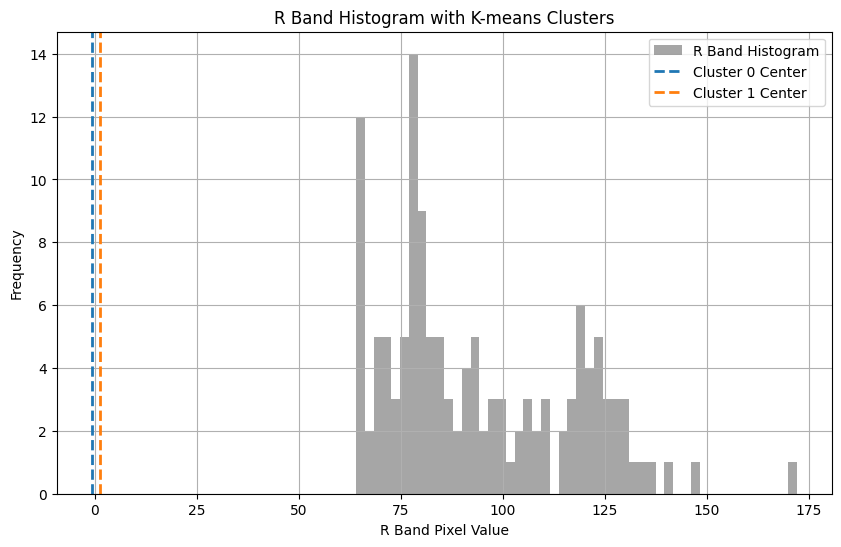

Map(center=[39.05159689268615, -76.69160401297148], controls=(WidgetControl(options=['position', 'transparent_…

In [ ]:
# Import required libraries
import ee
import geemap
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Authenticate and initialize Earth Engine
ee.Authenticate()
ee.Initialize()

# Step 1: Define the boundary
boundary = ee.Geometry.Polygon([
    [[-76.694437, 39.051973], [-76.690928, 39.051973],
     [-76.690928, 39.05091], [-76.694437, 39.05091],
     [-76.694437, 39.051973]]
])

# Load the boundary and visualize
Map = geemap.Map()
Map.addLayer(boundary, {"color": "blue"}, "Boundary")
Map.centerObject(boundary, 16)

# Step 2: Load Maryland Structures and filter to boundary
maryland_structures = ee.FeatureCollection('projects/sat-io/open-datasets/ORNL/USA-STRUCTURES/USA_ST_MD') \
                         .filterBounds(boundary)

# Step 3: Load NAIP True Color imagery
naip_dataset = ee.ImageCollection('USDA/NAIP/DOQQ') \
                  .filterBounds(boundary) \
                  .filterDate('2023-01-01', '2024-12-31') \
                  .select(['R', 'G', 'B'])  # True color bands (Red, Green, Blue)

# Composite NAIP imagery for the boundary
naip_composite = naip_dataset.median()

# Add NAIP True Color to the map
Map.addLayer(naip_composite, {"min": 0, "max": 255}, "NAIP True Color")


# Function to clip NAIP imagery by Maryland structure BUILD_ID
def clip_naip_by_build_id(build_id):
    """
    Clips the NAIP composite imagery for a given Maryland structure BUILD_ID.
    """
    # Filter the structure by BUILD_ID
    structure = maryland_structures.filter(ee.Filter.eq('BUILD_ID', build_id)).first()

    # If structure is not found, raise an error
    if structure is None:
        print(f"No structure found with BUILD_ID: {build_id}")
        return None

    # Get the structure's geometry
    structure_geometry = structure.geometry()

    # Highlight the structure boundary in red
    Map.addLayer(structure_geometry, {"color": "red", "width": 2}, f"Boundary for BUILD_ID: {build_id}")

    # Zoom to the structure
    Map.centerObject(structure_geometry, 18)

    # Clip the NAIP composite to the structure's geometry
    clipped_image = naip_composite.clip(structure_geometry)
    print(f"NAIP imagery clipped for BUILD_ID: {build_id}")
    return clipped_image


# Function to extract pixel values for the R band
def extract_r_band_pixel_values(clipped_image):
    """
    Extracts pixel values for the R band as a NumPy array.
    """
    # Reduce the image to get pixel values as a list for the R band
    band_stats = clipped_image.reduceRegion(
        reducer=ee.Reducer.toList(),
        geometry=clipped_image.geometry(),
        scale=1,  # NAIP resolution (1 meter)
        maxPixels=1e13
    ).getInfo()

    # Extract pixel values for the R band
    r_values = np.array(band_stats['R'])
    return r_values


# Function to perform K-means clustering on the R band
def kmeans_clustering_r_band(r_values, n_clusters=3):
    """
    Performs K-means clustering on the R band pixel values.
    """
    # Reshape and standardize the data
    r_values_reshaped = r_values.reshape(-1, 1)  # Reshape for clustering
    scaler = StandardScaler()
    r_values_scaled = scaler.fit_transform(r_values_reshaped)

    # Apply K-means clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(r_values_scaled)

    return cluster_labels, kmeans.cluster_centers_


# Function to visualize clustering results with a histogram
def visualize_r_band_clusters(r_values, cluster_labels, cluster_centers):
    """
    Visualizes the R band clusters with a histogram and overlays cluster statistics.
    """
    # Count pixels in each cluster
    unique_labels, counts = np.unique(cluster_labels, return_counts=True)

    # Print cluster statistics
    print("\nCluster Statistics (R Band):")
    for label, count in zip(unique_labels, counts):
        print(f"Cluster {label}: {count} pixels")

    # Plot histogram of R band values
    plt.figure(figsize=(10, 6))
    plt.hist(r_values, bins=50, color='gray', alpha=0.7, label='R Band Histogram')
    for i, center in enumerate(cluster_centers):
        plt.axvline(center, color=f'C{i}', linestyle='dashed', linewidth=2, label=f'Cluster {i} Center')
    plt.title('R Band Histogram with K-means Clusters')
    plt.xlabel('R Band Pixel Value')
    plt.ylabel('Frequency')
    plt.legend()
    plt.grid(True)
    plt.show()

# Function to calculate cluster dominance ratio
def calculate_cluster_ratio(cluster_labels):
    """
    Calculates the dominance ratio of clusters.
    Returns the ratio of the largest cluster to the total pixels.
    """
    unique_labels, counts = np.unique(cluster_labels, return_counts=True)
    total_pixels = np.sum(counts)
    dominant_ratio = np.max(counts) / total_pixels

    print("\nCluster Dominance Ratio:")
    for label, count in zip(unique_labels, counts):
        print(f"Cluster {label}: {count} pixels, Ratio: {count / total_pixels:.2f}")

    return dominant_ratio

# Function to classify based on cluster dominance
def classify_solar_panel(dominance_ratio, threshold=0.7):
    """
    Classifies the presence of solar panels based on the dominance ratio.
    """
    if dominance_ratio < threshold:
        print("Solar panel detected (multiple reflective classes).")
    else:
        print("No solar panel detected (single dominant class).")

# Example Usage
build_id = 7362720  # Replace with an actual BUILD_ID from the dataset
clipped_image = clip_naip_by_build_id(build_id)

if clipped_image:
    # Extract R band pixel values
    r_values = extract_r_band_pixel_values(clipped_image)

    # Perform K-means clustering on the R band
    cluster_labels, cluster_centers = kmeans_clustering_r_band(r_values, n_clusters=2)

    # Calculate cluster dominance ratio
    dominance_ratio = calculate_cluster_ratio(cluster_labels)

    # Classify solar panel presence
    classify_solar_panel(dominance_ratio, threshold=0.75)

    # Visualize the clustering results with a histogram
    visualize_r_band_clusters(r_values, cluster_labels, cluster_centers)

# Display the map
Map





In [ ]:
import ee
import geemap
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Authenticate and initialize Earth Engine
ee.Authenticate()
ee.Initialize()

# Step 1: Define the boundary for Prince George's County
counties = ee.FeatureCollection('TIGER/2018/Counties')  # US counties dataset
prince_george_boundary = counties.filter(
    ee.Filter.And(
        ee.Filter.eq('STATEFP', '24'),  # Maryland's state FIPS code
        ee.Filter.eq('NAME', "Prince George's")  # County name
    )
)

# Visualize Prince George's County boundary
Map = geemap.Map()
Map.addLayer(prince_george_boundary, {"color": "blue"}, "Prince George's County Boundary")
Map.centerObject(prince_george_boundary, 9)

# Step 2: Load Maryland Structures and filter to Prince George's County
maryland_structures = ee.FeatureCollection('projects/sat-io/open-datasets/ORNL/USA-STRUCTURES/USA_ST_MD') \
                        .filterBounds(prince_george_boundary)

# Step 3: Load NAIP True Color imagery
naip_dataset = ee.ImageCollection('USDA/NAIP/DOQQ') \
                  .filterBounds(prince_george_boundary) \
                  .filterDate('2023-01-01', '2024-12-31') \
                  .select(['R', 'G', 'B'])  # True color bands (Red, Green, Blue)

# Composite NAIP imagery
naip_composite = naip_dataset.median()

# Function to clip NAIP imagery by BUILD_ID
def clip_naip_by_build_id(build_id):
    structure = maryland_structures.filter(ee.Filter.eq('BUILD_ID', build_id)).first()
    if structure is None:
        return None
    structure_geometry = structure.geometry()
    return naip_composite.clip(structure_geometry), structure_geometry

# Function to extract pixel values for the R band
def extract_r_band_pixel_values(clipped_image):
    band_stats = clipped_image.reduceRegion(
        reducer=ee.Reducer.toList(),
        geometry=clipped_image.geometry(),
        scale=1,  # NAIP resolution (1 meter)
        maxPixels=1e13
    ).getInfo()
    return np.array(band_stats['R'])

# Function to perform K-means clustering on the R band
def kmeans_clustering_r_band(r_values, n_clusters=2):
    r_values_reshaped = r_values.reshape(-1, 1)
    scaler = StandardScaler()
    r_values_scaled = scaler.fit_transform(r_values_reshaped)
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    return kmeans.fit_predict(r_values_scaled), kmeans.cluster_centers_

# Function to calculate cluster dominance ratio
def calculate_cluster_ratio(cluster_labels):
    unique_labels, counts = np.unique(cluster_labels, return_counts=True)
    total_pixels = np.sum(counts)
    return np.max(counts) / total_pixels

# Function to classify solar panel presence
def classify_solar_panel(dominance_ratio, threshold=0.7):
    return dominance_ratio < threshold

# Step 4: Process all BUILD_IDs in the county
solar_panel_structures = []  # To store geometries with solar panels
build_ids = maryland_structures.aggregate_array('BUILD_ID').getInfo()

for build_id in build_ids:
    try:
        clipped_image, structure_geometry = clip_naip_by_build_id(build_id)
        if clipped_image is None:
            continue

        # Extract R band pixel values
        r_values = extract_r_band_pixel_values(clipped_image)
        if len(r_values) == 0:
            continue

        # Perform K-means clustering and calculate cluster dominance ratio
        cluster_labels, _ = kmeans_clustering_r_band(r_values, n_clusters=2)
        dominance_ratio = calculate_cluster_ratio(cluster_labels)

        # Check if the structure has a solar panel
        if classify_solar_panel(dominance_ratio, threshold=0.7):
            solar_panel_structures.append(structure_geometry)

    except Exception as e:
        print(f"Error processing BUILD_ID {build_id}: {e}")

# Step 5: Visualize structures with solar panels on the map
for geometry in solar_panel_structures:
    Map.addLayer(geometry, {"color": "red"}, "Solar Panels Detected")

# Display the map
Map


EEException: ee.Initialize: no project found. Call with project= or see http://goo.gle/ee-auth.

In [ ]:
# prompt: /NAIP_Clip_0.tif is a GeoTIFF file. read this file

import rasterio

def read_geotiff(filepath):
    try:
        with rasterio.open(filepath) as dataset:
            # Access metadata
            print("Driver:", dataset.driver)
            print("Width:", dataset.width)
            print("Height:", dataset.height)
            print("Count:", dataset.count)
            print("CRS:", dataset.crs)
            print("Transform:", dataset.transform)

            # Read data as NumPy array
            data = dataset.read()
            # Process the data (e.g., display it, perform calculations, etc.)
            print("Data shape:", data.shape) # Example processing
            return data
    except rasterio.errors.RasterioIOError as e:
        print(f"Error opening or reading GeoTIFF file: {e}")
        return None

# Example usage
file_path = './NAIP_Clip_26.tif'
data = read_geotiff(file_path)

Driver: GTiff
Width: 20
Height: 17
Count: 3
CRS: EPSG:4326
Transform: | 0.00, 0.00,-76.69|
| 0.00,-0.00, 39.05|
| 0.00, 0.00, 1.00|
Data shape: (3, 17, 20)


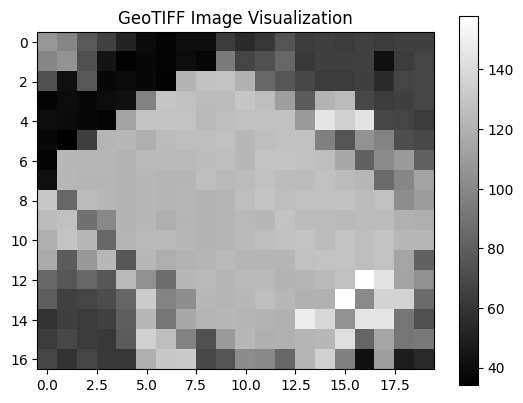

In [ ]:
# prompt: convert it to raster and visualzie

import matplotlib.pyplot as plt

# Assuming 'data' from read_geotiff function is a numpy array
# and represents a single-band GeoTIFF (e.g., elevation data)
if data is not None:
  # Display the first band (if multi-band)
  plt.imshow(data[2], cmap='gray')  # Use 'gray' or other appropriate colormap
  plt.title('GeoTIFF Image Visualization')
  plt.colorbar() # Add a colorbar for better interpretation
  plt.show()

In [ ]:
!pip install -q transformers

To download the model, simply instantiate it.

In [ ]:
from transformers import CLIPSegProcessor, CLIPSegForImageSegmentation

processor = CLIPSegProcessor.from_pretrained("CIDAS/clipseg-rd64-refined")
model = CLIPSegForImageSegmentation.from_pretrained("CIDAS/clipseg-rd64-refined")

preprocessor_config.json:   0%|          | 0.00/380 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/974 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.73k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/603M [00:00<?, ?B/s]

Now we can load an image to try out the segmentation. We'll choose a picture of a delicious breakfast taken by [Calum Lewis](https://unsplash.com/@calumlewis).

In [ ]:
from PIL import Image
import requests

url = "https://unsplash.com/photos/8Nc_oQsc2qQ/download?ixid=MnwxMjA3fDB8MXxhbGx8fHx8fHx8fHwxNjcxMjAwNzI0&force=true&w=640"
image = Image.open(requests.get(url, stream=True).raw)
image

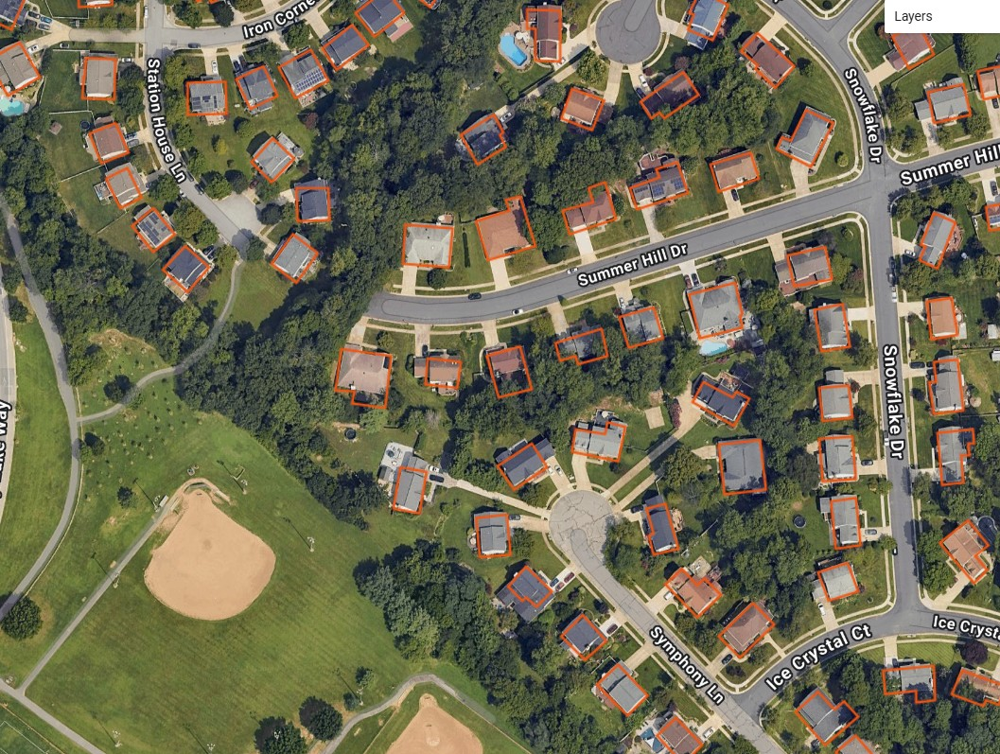

In [ ]:
# prompt: /content/testing_sp.jpg ope using PIL

from PIL import Image
image = Image.open("/content/sp_sample8.jpg")
image

## Text prompting

Let’s start by defining some text categories we want to segment.

In [ ]:
prompts = ["Solar panels installed on roofs with rows"]

Now that we have our inputs, we can process them and input them to the model.

In [ ]:
import torch

inputs = processor(text=prompts, images=[image] * len(prompts), padding="max_length", return_tensors="pt")
# predict
with torch.no_grad():
  outputs = model(**inputs)
preds = outputs.logits.unsqueeze(1)

Finally, let’s visualize the output.

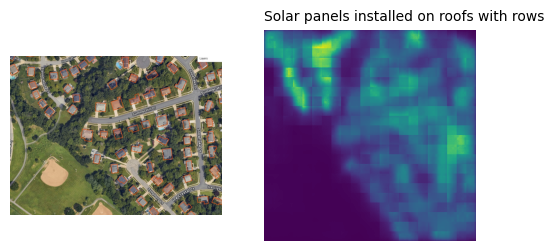

In [ ]:
import matplotlib.pyplot as plt

_, ax = plt.subplots(1, len(prompts) + 1, figsize=(3*(len(prompts) + 1), 4))
[a.axis('off') for a in ax.flatten()]
ax[0].imshow(image)
[ax[i+1].imshow(torch.sigmoid(preds[i][0])) for i in range(len(prompts))];
[ax[i+1].text(0, -15, prompt) for i, prompt in enumerate(prompts)];

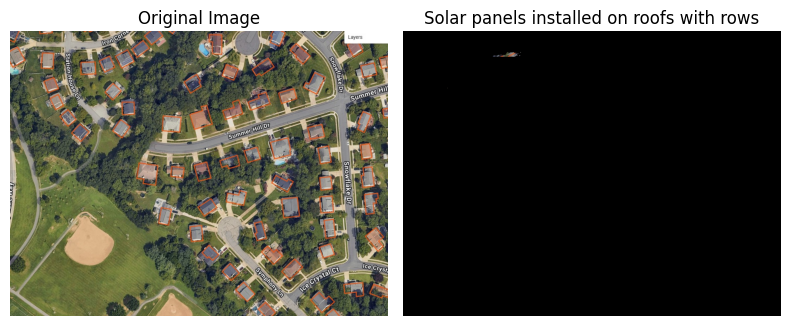

In [ ]:
import matplotlib.pyplot as plt
import torch
import numpy as np
from PIL import Image

# Convert PIL image to NumPy array
image = np.array(image)  # Ensure the image is a NumPy array (H, W, 3)

# Apply sigmoid to get probabilities from logits
probabilities = torch.sigmoid(preds).squeeze(1)  # Shape: (num_prompts, H_mask, W_mask)

# Resize masks to match the original image dimensions
segmented_images = []
for i in range(len(prompts)):
    # Convert mask to numpy array
    mask = probabilities[i].detach().cpu().numpy()  # Shape: (H_mask, W_mask)

    # Resize the mask to match the image dimensions (H_image, W_image)
    from skimage.transform import resize
    resized_mask = resize(mask, (image.shape[0], image.shape[1]), mode='constant', anti_aliasing=True)

    # Threshold the resized mask (adjust threshold as needed)
    binary_mask = (resized_mask > 0.5).astype(np.bool_)  # Binary mask (True for segmented regions)

    # Apply the mask to the original image
    segmented_image = np.zeros_like(image)  # Create a blank image with the same shape as the original
    segmented_image[binary_mask] = image[binary_mask]  # Copy segmented regions from the original image
    segmented_images.append(segmented_image)

# Plot the original image and segmented images
fig, ax = plt.subplots(1, len(prompts) + 1, figsize=(4 * (len(prompts) + 1), 6))
[a.axis('off') for a in ax]

# Show the original image in the first subplot
ax[0].imshow(image)
ax[0].set_title("Original Image")

# Show segmented images
for i, prompt in enumerate(prompts):
    ax[i + 1].imshow(segmented_images[i])
    ax[i + 1].set_title(prompt)

plt.tight_layout()
plt.show()


## Visual prompting

As mentioned before, we can also use images as the input prompts (i.e. in place of the category names). This can be especially useful if it's not easy to describe the thing you want to segment. For this example, we'll use a picture of a coffee cup taken by [Daniel Hooper](https://unsplash.com/@dan_fromyesmorecontent).

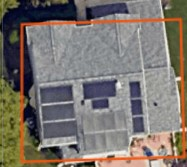

In [ ]:
url = "https://unsplash.com/photos/Ki7sAc8gOGE/download?ixid=MnwxMjA3fDB8MXxzZWFyY2h8MTJ8fGNvZmZlJTIwdG8lMjBnb3xlbnwwfHx8fDE2NzExOTgzNDQ&force=true&w=640"
prompt = Image.open("/content/sp_true.jpg")
prompt

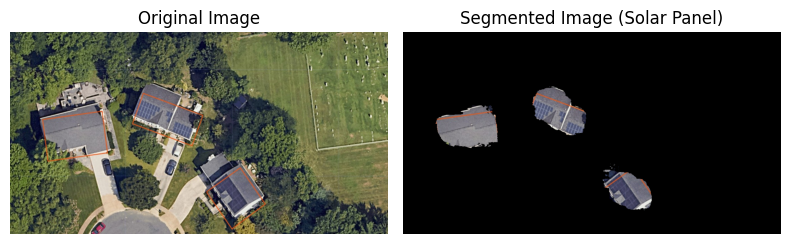

In [ ]:
# prompt: /content/sp_true.jpg as visula\ prompt

from transformers import CLIPSegProcessor, CLIPSegForImageSegmentation
from PIL import Image
import requests
import torch
import matplotlib.pyplot as plt
import numpy as np
from skimage.transform import resize

# Using CLIPSeg with Hugging Face Transformers
processor = CLIPSegProcessor.from_pretrained("CIDAS/clipseg-rd64-refined")
model = CLIPSegForImageSegmentation.from_pretrained("CIDAS/clipseg-rd64-refined")

# Load the image from the local file path
image = Image.open("/content/testing_sp.jpg")

# ## Visual prompting
# Use an image as the visual prompt
prompt_image = Image.open("/content/sp_true.jpg") # Use the same image as the visual prompt

inputs = processor(text=["solar panel"], images=[image], padding="max_length", return_tensors="pt")

with torch.no_grad():
  outputs = model(**inputs)
preds = outputs.logits.unsqueeze(1)

# Convert PIL image to NumPy array
image = np.array(image)

# Apply sigmoid and resize mask
probabilities = torch.sigmoid(preds).squeeze(1)
segmented_images = []
for i in range(1): # Only one prompt in this case
    mask = probabilities[i].detach().cpu().numpy()
    resized_mask = resize(mask, (image.shape[0], image.shape[1]), mode='constant', anti_aliasing=True)
    binary_mask = (resized_mask > 0.5).astype(np.bool_)
    segmented_image = np.zeros_like(image)
    segmented_image[binary_mask] = image[binary_mask]
    segmented_images.append(segmented_image)


# Plot the original image and segmented image
fig, ax = plt.subplots(1, 2, figsize=(8, 6))
[a.axis('off') for a in ax]
ax[0].imshow(image)
ax[0].set_title("Original Image")
ax[1].imshow(segmented_images[0])
ax[1].set_title("Segmented Image (Solar Panel)")
plt.tight_layout()
plt.show()

Cropped house region saved: /content/cropped_house_1.jpg
Cropped house region saved: /content/cropped_house_2.jpg
Cropped house region saved: /content/cropped_house_3.jpg
Cropped house region saved: /content/cropped_house_4.jpg
Cropped house region saved: /content/cropped_house_5.jpg
Cropped house region saved: /content/cropped_house_6.jpg
Cropped house region saved: /content/cropped_house_7.jpg
Cropped house region saved: /content/cropped_house_8.jpg
Cropped house region saved: /content/cropped_house_9.jpg
Cropped house region saved: /content/cropped_house_10.jpg
Cropped house region saved: /content/cropped_house_11.jpg
Cropped house region saved: /content/cropped_house_12.jpg
Cropped house region saved: /content/cropped_house_13.jpg
Cropped house region saved: /content/cropped_house_14.jpg
Cropped house region saved: /content/cropped_house_15.jpg
Cropped house region saved: /content/cropped_house_16.jpg
Cropped house region saved: /content/cropped_house_17.jpg


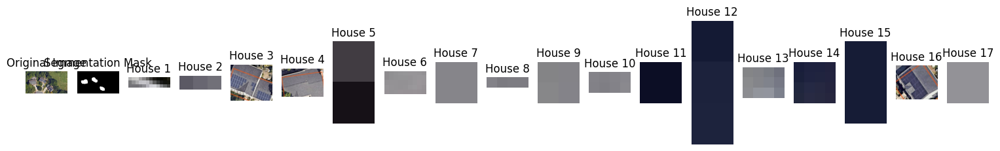

In [ ]:
from transformers import CLIPSegProcessor, CLIPSegForImageSegmentation
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from skimage.transform import resize
from skimage.measure import label, regionprops
import torch

# Load CLIPSeg processor and model
processor = CLIPSegProcessor.from_pretrained("CIDAS/clipseg-rd64-refined")
model = CLIPSegForImageSegmentation.from_pretrained("CIDAS/clipseg-rd64-refined")

# Load the target image
image_path = "/content/testing_sp.jpg"  # Original image
image = Image.open(image_path)
image_np = np.array(image)  # Convert to NumPy array

# Prepare inputs for CLIPSeg
inputs = processor(
    text=["solar panel"],  # Text prompt
    images=[image],
    return_tensors="pt",
    padding="max_length"
)

# Perform segmentation
with torch.no_grad():
    outputs = model(**inputs)

# Process the output logits
preds = outputs.logits.unsqueeze(1)
probabilities = torch.sigmoid(preds).squeeze(1)  # Convert logits to probabilities

# Create a binary mask from the probabilities
mask = probabilities[0].detach().cpu().numpy()
resized_mask = resize(mask, (image_np.shape[0], image_np.shape[1]), mode='constant', anti_aliasing=True)
binary_mask = (resized_mask > 0.5).astype(np.bool_)  # Threshold for binary mask

# Label connected components in the binary mask
labeled_mask = label(binary_mask)
regions = regionprops(labeled_mask)

# Extract and save each house region based on the binary mask
for i, region in enumerate(regions):
    # Get bounding box for each region
    min_row, min_col, max_row, max_col = region.bbox

    # Crop the corresponding region from the original image
    cropped_house = image_np[min_row:max_row, min_col:max_col]

    # Save the cropped house region as an image
    cropped_house_image = Image.fromarray(cropped_house)
    cropped_house_image.save(f"/content/cropped_house_{i + 1}.jpg")
    print(f"Cropped house region saved: /content/cropped_house_{i + 1}.jpg")

# Plot the original image, segmentation mask, and cropped house regions
fig, ax = plt.subplots(1, len(regions) + 2, figsize=(15, 6))

# Original Image
ax[0].imshow(image_np)
ax[0].axis("off")
ax[0].set_title("Original Image")

# Segmentation Mask
ax[1].imshow(binary_mask, cmap="gray")
ax[1].axis("off")
ax[1].set_title("Segmentation Mask")

# Cropped House Regions
for i, region in enumerate(regions):
    min_row, min_col, max_row, max_col = region.bbox
    cropped_house = image_np[min_row:max_row, min_col:max_col]
    ax[i + 2].imshow(cropped_house)
    ax[i + 2].axis("off")
    ax[i + 2].set_title(f"House {i + 1}")

plt.tight_layout()
plt.show()


We can now process the input image and prompt image and input them to the model.

Cropped house region saved: /content/cropped_house_1.jpg
Cropped house region saved: /content/cropped_house_2.jpg
Cropped house region saved: /content/cropped_house_3.jpg


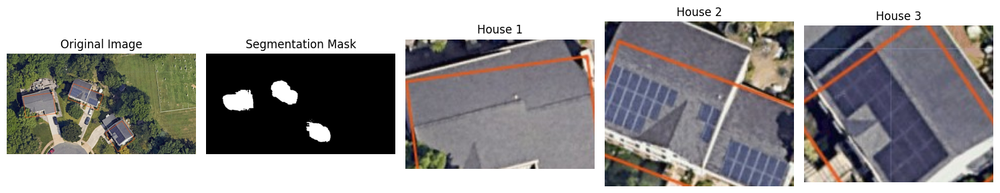

In [ ]:
from transformers import CLIPSegProcessor, CLIPSegForImageSegmentation
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from skimage.transform import resize
from skimage.measure import label, regionprops
import torch

# Load CLIPSeg processor and model
processor = CLIPSegProcessor.from_pretrained("CIDAS/clipseg-rd64-refined")
model = CLIPSegForImageSegmentation.from_pretrained("CIDAS/clipseg-rd64-refined")

# Load the target image
image_path = "/content/testing_sp.jpg"  # Original image
image = Image.open(image_path)
image_np = np.array(image)  # Convert to NumPy array

# Prepare inputs for CLIPSeg
inputs = processor(
    text=["solar panel"],  # Text prompt
    images=[image],
    return_tensors="pt",
    padding="max_length"
)

# Perform segmentation
with torch.no_grad():
    outputs = model(**inputs)

# Process the output logits
preds = outputs.logits.unsqueeze(1)
probabilities = torch.sigmoid(preds).squeeze(1)  # Convert logits to probabilities

# Create a binary mask from the probabilities
mask = probabilities[0].detach().cpu().numpy()
resized_mask = resize(mask, (image_np.shape[0], image_np.shape[1]), mode='constant', anti_aliasing=True)
binary_mask = (resized_mask > 0.5).astype(np.bool_)  # Threshold for binary mask

# Label connected components in the binary mask
labeled_mask = label(binary_mask)
regions = regionprops(labeled_mask)

# Filter and keep only the 3 largest regions by area
regions = sorted(regions, key=lambda r: r.area, reverse=True)[:3]

# Extract and save each of the 3 largest house regions
for i, region in enumerate(regions):
    # Get bounding box for each region
    min_row, min_col, max_row, max_col = region.bbox

    # Crop the corresponding region from the original image
    cropped_house = image_np[min_row:max_row, min_col:max_col]

    # Save the cropped house region as an image
    cropped_house_image = Image.fromarray(cropped_house)
    cropped_house_image.save(f"/content/cropped_house_{i + 1}.jpg")
    print(f"Cropped house region saved: /content/cropped_house_{i + 1}.jpg")

# Plot the original image, segmentation mask, and the 3 largest house regions
fig, ax = plt.subplots(1, len(regions) + 2, figsize=(15, 6))

# Original Image
ax[0].imshow(image_np)
ax[0].axis("off")
ax[0].set_title("Original Image")

# Segmentation Mask
ax[1].imshow(binary_mask, cmap="gray")
ax[1].axis("off")
ax[1].set_title("Segmentation Mask")

# Cropped House Regions
for i, region in enumerate(regions):
    min_row, min_col, max_row, max_col = region.bbox
    cropped_house = image_np[min_row:max_row, min_col:max_col]
    ax[i + 2].imshow(cropped_house)
    ax[i + 2].axis("off")
    ax[i + 2].set_title(f"House {i + 1}")

plt.tight_layout()
plt.show()


In [ ]:
encoded_image = processor(images=[image], return_tensors="pt")
encoded_prompt = processor(images=[prompt], return_tensors="pt")
# predict
with torch.no_grad():
  outputs = model(**encoded_image, conditional_pixel_values=encoded_prompt.pixel_values)
preds = outputs.logits.unsqueeze(1)
preds = torch.transpose(preds, 0, 1)

TypeError: Invalid shape (1, 352, 352) for image data

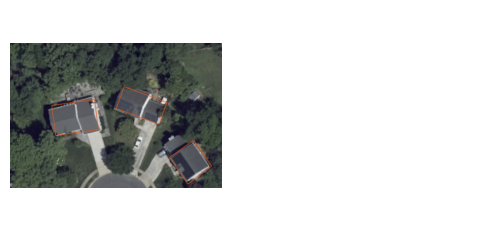

In [ ]:
_, ax = plt.subplots(1, 2, figsize=(6, 4))
[a.axis('off') for a in ax.flatten()]
ax[0].imshow(image)
ax[1].imshow(torch.sigmoid(preds[0]))

Let’s try one last time by using the visual prompting tips described in the paper, i.e. cropping the image and darkening the background.

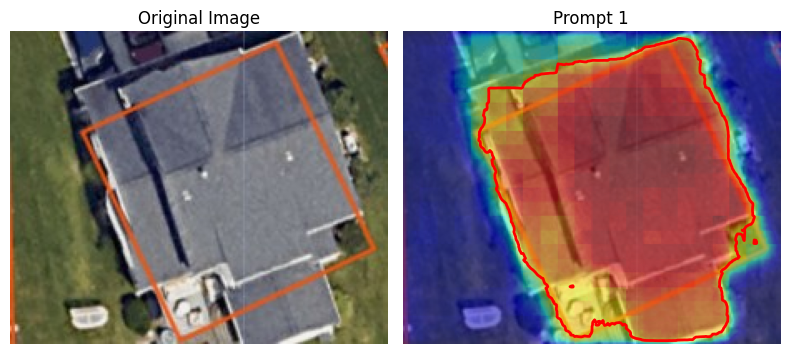

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF
import torch.nn.functional as F

# Assume `image` is the input image (PIL or numpy array)
# Assume `prompt` is the prompt image or text converted to pixel values
# Assume `model` and `processor` are preloaded
image=Image.open("/content/sp_sample1.jpg")
prompt=Image.open("/content/sp_true.jpg")
# Encode the input image and the prompt
encoded_image = processor(images=[image], return_tensors="pt")
encoded_prompt = processor(images=[prompt], return_tensors="pt")

# Predict segmentation logits
with torch.no_grad():
    outputs = model(**encoded_image, conditional_pixel_values=encoded_prompt.pixel_values)
preds = outputs.logits.unsqueeze(1)  # Shape: (1, C, H, W)
preds = torch.transpose(preds, 0, 1)  # Adjust shape to (C, 1, H, W)

# Apply activation (sigmoid for binary segmentation)
probabilities = torch.sigmoid(preds).squeeze(1)  # Shape: (C, H, W)

# Resize predictions to match the original image dimensions
resized_masks = []
for i in range(probabilities.shape[0]):
    mask = probabilities[i]  # Shape: (H, W)
    # Resize the mask using torch.nn.functional.interpolate
    resized_mask = F.interpolate(mask.unsqueeze(0).unsqueeze(0),  # Add batch and channel dims
                                  size=(image.size[1], image.size[0]),  # Target size (H, W)
                                  mode="bilinear", align_corners=False).squeeze().cpu().numpy()
    resized_masks.append(resized_mask)

# Plot the original image and segmentation results
fig, ax = plt.subplots(1, len(resized_masks) + 1, figsize=(4 * (len(resized_masks) + 1), 6))

# Show the original image
ax[0].imshow(image)
ax[0].axis("off")
ax[0].set_title("Original Image")

# Overlay predictions for each prompt
for i, mask in enumerate(resized_masks):
    ax[i + 1].imshow(image)
    ax[i + 1].imshow(mask, alpha=0.5, cmap="jet")  # Overlay mask with transparency
    ax[i + 1].contour(mask, levels=[0.5], colors="red", linewidths=2)  # Add boundary
    ax[i + 1].axis("off")
    ax[i + 1].set_title(f"Prompt {i + 1}")

plt.tight_layout()
plt.show()


In [ ]:
import torch
from PIL import Image
from transformers import CLIPProcessor, CLIPModel
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

# Load the CLIP model and processor
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

def calculate_clip_embedding(image, processor, model):
    """
    Calculate CLIP embedding for an image.
    """
    inputs = processor(images=image, return_tensors="pt", padding=True)
    with torch.no_grad():
        image_features = model.get_image_features(**inputs)
    return image_features.cpu().numpy()

def compare_embeddings(embedding1, embedding2, method='cosine'):
    """
    Compare two embeddings using cosine similarity or euclidean distance.
    """
    if method == 'cosine':
        # Cosine similarity
        similarity = cosine_similarity(embedding1, embedding2)
        return similarity[0][0]
    elif method == 'euclidean':
        # Euclidean distance
        distance = np.linalg.norm(embedding1 - embedding2)
        return distance
    else:
        raise ValueError("Unsupported comparison method. Use 'cosine' or 'euclidean'.")




In [ ]:
from PIL import Image

def crop_center(image, crop_percentage=0.75):
    """
    Crop the center of the image by the specified percentage.
    """
    width, height = image.size
    crop_width = int(width * crop_percentage)
    crop_height = int(height * crop_percentage)

    left = (width - crop_width) // 2
    top = (height - crop_height) // 2
    right = left + crop_width
    bottom = top + crop_height

    return image.crop((left, top, right, bottom))

# Load images (PIL format)
predicted_image = Image.open("/content/cropped_house_1.jpg")
ground_truth_image = Image.open("/content/cropped_house_2.jpg")

# Crop images to 75% of their size (center)
predicted_image_cropped = crop_center(predicted_image, crop_percentage=0.75)
ground_truth_image_cropped = crop_center(ground_truth_image, crop_percentage=0.75)

# Calculate embeddings
predicted_embedding = calculate_clip_embedding(predicted_image_cropped, processor, model)
ground_truth_embedding = calculate_clip_embedding(ground_truth_image_cropped, processor, model)

# Compare embeddings
cosine_sim = compare_embeddings(predicted_embedding, ground_truth_embedding, method='cosine')
euclidean_dist = compare_embeddings(predicted_embedding, ground_truth_embedding, method='euclidean')

# Print results
print(f"Cosine Similarity (cropped): {cosine_sim:.4f}")
print(f"Euclidean Distance (cropped): {euclidean_dist:.4f}")


Cosine Similarity (cropped): 0.8155
Euclidean Distance (cropped): 7.2315


In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import torch
from transformers import CLIPProcessor, CLIPModel
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

# Load the CLIP model and processor
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

def calculate_image_embedding(image, processor, model):
    """
    Calculate CLIP embedding for an image.
    """
    inputs = processor(images=image, return_tensors="pt")
    with torch.no_grad():
        image_features = model.get_image_features(**inputs)
    return image_features.cpu().numpy()

def calculate_text_embedding(text, processor, model):
    """
    Calculate CLIP embedding for a text prompt.
    """
    inputs = processor(text=[text], return_tensors="pt", padding=True)
    with torch.no_grad():
        text_features = model.get_text_features(**inputs)
    return text_features.cpu().numpy()

def compare_embeddings(embedding1, embedding2, method='cosine'):
    """
    Compare two embeddings using cosine similarity or euclidean distance.
    """
    if method == 'cosine':
        # Cosine similarity
        similarity = cosine_similarity(embedding1, embedding2)
        return similarity[0][0]
    elif method == 'euclidean':
        # Euclidean distance
        distance = np.linalg.norm(embedding1 - embedding2)
        return distance
    else:
        raise ValueError("Unsupported comparison method. Use 'cosine' or 'euclidean'.")

def crop_center(image, crop_percentage=0.75):
    """
    Crop the center of the image by the specified percentage.
    """
    width, height = image.size
    crop_width = int(width * crop_percentage)
    crop_height = int(height * crop_percentage)
    left = (width - crop_width) // 2
    top = (height - crop_height) // 2
    right = left + crop_width
    bottom = top + crop_height
    return image.crop((left, top, right, bottom))

# Load images (PIL format)
predicted_image = Image.open("/content/sp_sample6.jpg")
ground_truth_image = Image.open("/content/sp_sample7.jpg")

# Crop images to 75% of their size (center)
predicted_image_cropped = crop_center(predicted_image, crop_percentage=0.75)
ground_truth_image_cropped = crop_center(ground_truth_image, crop_percentage=0.75)

# Calculate embeddings for images
predicted_embedding = calculate_image_embedding(predicted_image_cropped, processor, model)
ground_truth_embedding = calculate_image_embedding(ground_truth_image_cropped, processor, model)



Cosine Similarity (Predicted vs Text): 0.2234
Cosine Similarity (Ground Truth vs Text): 0.1974
Euclidean Distance (Predicted vs Text): 13.2990
Euclidean Distance (Ground Truth vs Text): 13.5234


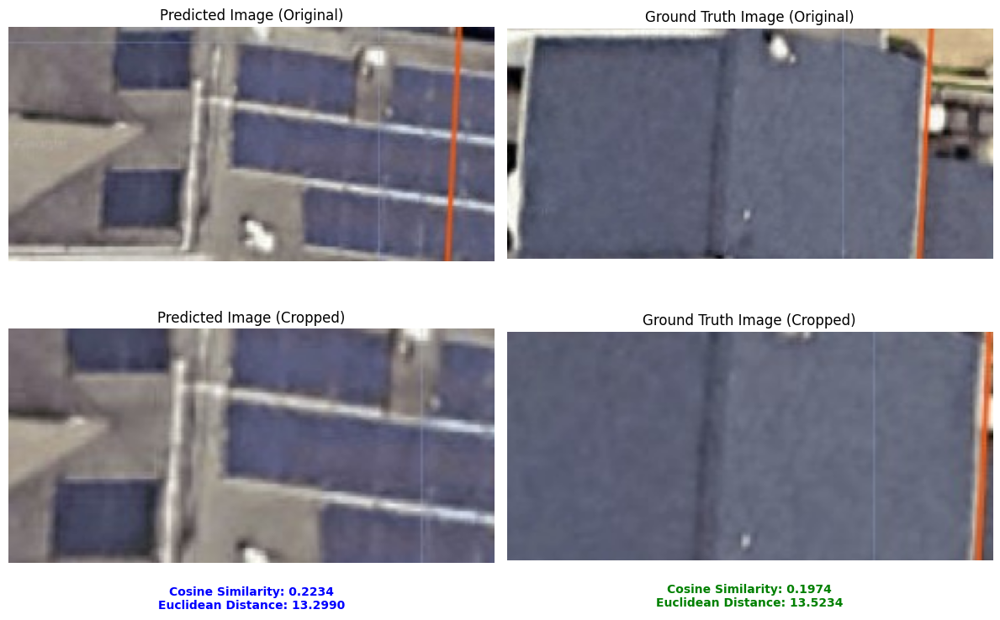

In [ ]:

# Calculate text embedding for "solar panel"
text_embedding = calculate_text_embedding("rooftop with visible solar panels arranged in rows", processor, model)

# Compare image embeddings with text embedding
predicted_cosine_sim = compare_embeddings(predicted_embedding, text_embedding, method='cosine')
ground_truth_cosine_sim = compare_embeddings(ground_truth_embedding, text_embedding, method='cosine')

predicted_euclidean_dist = compare_embeddings(predicted_embedding, text_embedding, method='euclidean')
ground_truth_euclidean_dist = compare_embeddings(ground_truth_embedding, text_embedding, method='euclidean')

# Print results
print(f"Cosine Similarity (Predicted vs Text): {predicted_cosine_sim:.4f}")
print(f"Cosine Similarity (Ground Truth vs Text): {ground_truth_cosine_sim:.4f}")
print(f"Euclidean Distance (Predicted vs Text): {predicted_euclidean_dist:.4f}")
print(f"Euclidean Distance (Ground Truth vs Text): {ground_truth_euclidean_dist:.4f}")

# Visualization: Original and Cropped Images
fig, ax = plt.subplots(2, 2, figsize=(12, 8))

# Show original images
ax[0, 0].imshow(predicted_image)
ax[0, 0].axis("off")
ax[0, 0].set_title("Predicted Image (Original)")

ax[0, 1].imshow(ground_truth_image)
ax[0, 1].axis("off")
ax[0, 1].set_title("Ground Truth Image (Original)")

# Show cropped images with similarity and distance scores
ax[1, 0].imshow(predicted_image_cropped)
ax[1, 0].axis("off")
ax[1, 0].set_title("Predicted Image (Cropped)")
ax[1, 0].text(
    0.5, -0.1,
    f"Cosine Similarity: {predicted_cosine_sim:.4f}\nEuclidean Distance: {predicted_euclidean_dist:.4f}",
    fontsize=10, color="blue", ha="center", va="top", transform=ax[1, 0].transAxes, weight="bold"
)

ax[1, 1].imshow(ground_truth_image_cropped)
ax[1, 1].axis("off")
ax[1, 1].set_title("Ground Truth Image (Cropped)")
ax[1, 1].text(
    0.5, -0.1,
    f"Cosine Similarity: {ground_truth_cosine_sim:.4f}\nEuclidean Distance: {ground_truth_euclidean_dist:.4f}",
    fontsize=10, color="green", ha="center", va="top", transform=ax[1, 1].transAxes, weight="bold"
)

plt.tight_layout()
plt.show()

Solar panels detected in 1 regions.


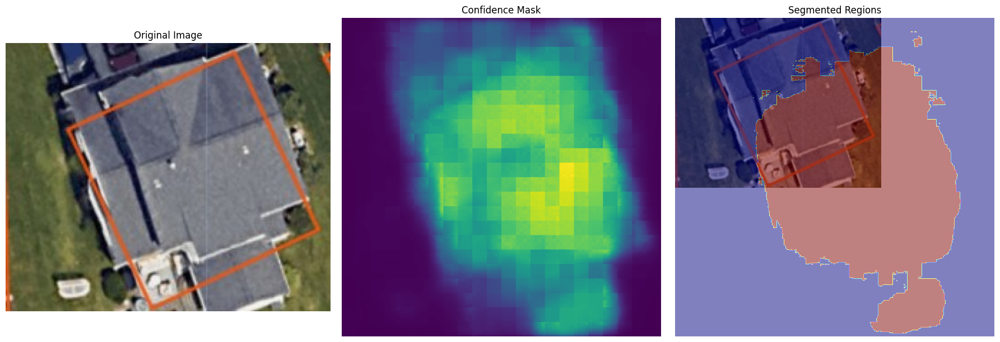

In [ ]:
from transformers import CLIPSegProcessor, CLIPSegForImageSegmentation
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from skimage.measure import label, regionprops
import torch

# Load CLIPSeg processor and model
processor = CLIPSegProcessor.from_pretrained("CIDAS/clipseg-rd64-refined")
model = CLIPSegForImageSegmentation.from_pretrained("CIDAS/clipseg-rd64-refined")

# Load the target image
image_path = "/content/sp_sample1.jpg"  # Original image
image = Image.open(image_path)
image_np = np.array(image)  # Convert to NumPy array

# Prepare inputs for CLIPSeg
inputs = processor(
    text=["solar panel arranged in rows"],  # Text prompt
    images=[image],
    return_tensors="pt",
    padding="max_length"
)

# Perform segmentation
with torch.no_grad():
    outputs = model(**inputs)

# Process the output logits
preds = outputs.logits.unsqueeze(1)
probabilities = torch.sigmoid(preds).squeeze(1)  # Convert logits to probabilities

# Analyze the confidence mask
confidence_mask = probabilities[0].detach().cpu().numpy()

# Calculate confidence statistics
mean_confidence = confidence_mask.mean()
max_confidence = confidence_mask.max()

# Dynamic threshold based on confidence distribution
dynamic_threshold = mean_confidence + 0.2 * (max_confidence - mean_confidence)
binary_mask = (confidence_mask > dynamic_threshold).astype(np.bool_)

# Label connected components in the binary mask
labeled_mask = label(binary_mask)
regions = regionprops(labeled_mask)

# Validate the presence of solar panels
detected_regions = []
for region in regions:
    # Check if the region area is significant (filter noise)
    if region.area > 7000:  # Minimum area threshold
        detected_regions.append(region)

# Check if solar panels are detected
if len(detected_regions) > 0:
    print(f"Solar panels detected in {len(detected_regions)} regions.")
else:
    print("No solar panels detected.")

# Visualize the confidence mask and detected regions
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

# Original Image
ax[0].imshow(image_np)
ax[0].axis("off")
ax[0].set_title("Original Image")

# Confidence Mask
ax[1].imshow(confidence_mask, cmap="viridis")
ax[1].axis("off")
ax[1].set_title("Confidence Mask")

# Segmented Regions
ax[2].imshow(image_np)
ax[2].imshow(binary_mask, alpha=0.5, cmap="jet")
ax[2].axis("off")
ax[2].set_title("Segmented Regions")
plt.tight_layout()
plt.show()


/usr/local/lib/python3.10/dist-packages/transformers/image_processing_utils.py:41: UserWarning: The following named arguments are not valid for `ViTImageProcessor.preprocess` and were ignored: 'padding'
  return self.preprocess(images, **kwargs)


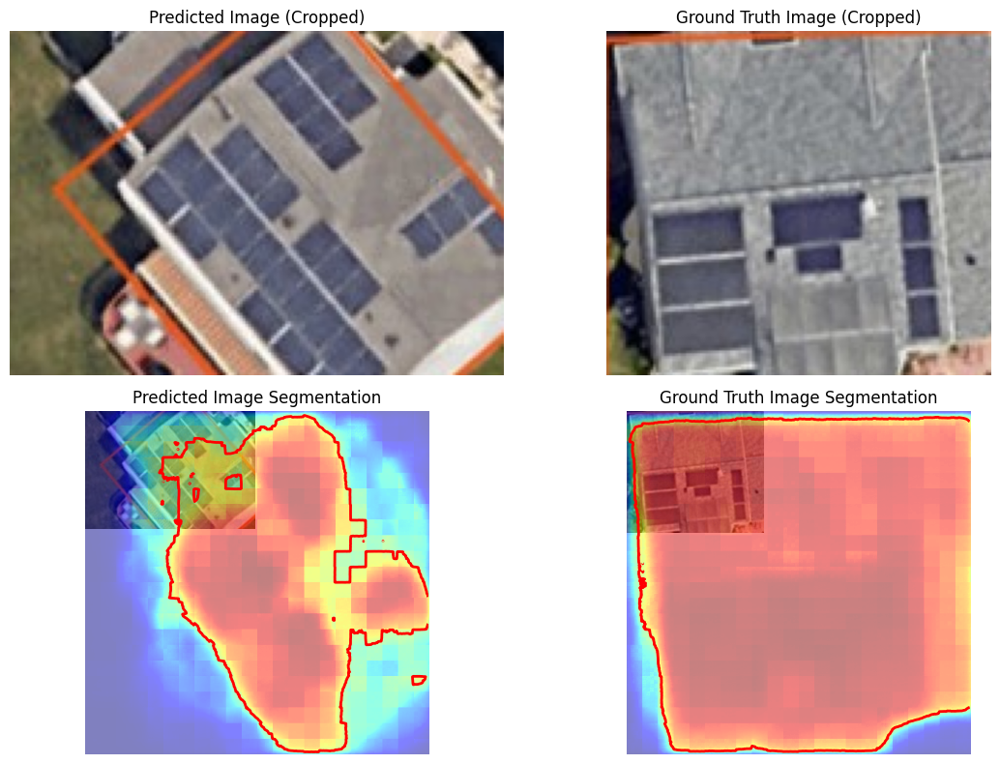

In [ ]:
import torch
from transformers import CLIPSegProcessor, CLIPSegForImageSegmentation
from PIL import Image
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF

# Load CLIPSeg model and processor
model = CLIPSegForImageSegmentation.from_pretrained("CIDAS/clipseg-rd64-refined")
processor = CLIPSegProcessor.from_pretrained("CIDAS/clipseg-rd64-refined")

def crop_center(image, crop_percentage=0.75):
    """
    Crop the center of the image by the specified percentage.
    """
    width, height = image.size
    crop_width = int(width * crop_percentage)
    crop_height = int(height * crop_percentage)
    left = (width - crop_width) // 2
    top = (height - crop_height) // 2
    right = left + crop_width
    bottom = top + crop_height
    return image.crop((left, top, right, bottom))

# Load images (PIL format)
predicted_image = Image.open("/content/sp_sample3.jpg")
ground_truth_image = Image.open("/content/sp_true.jpg")

# Crop images
predicted_image_cropped = crop_center(predicted_image, crop_percentage=0.75)
ground_truth_image_cropped = crop_center(ground_truth_image, crop_percentage=0.75)

# Prompt for segmentation
prompt = "solar panel"

# Process the cropped images with CLIPSeg
def apply_clipseg(image, prompt, processor, model):
    inputs = processor(text=prompt, images=image, return_tensors="pt", padding=True)
    with torch.no_grad():
        outputs = model(**inputs)
    mask = torch.sigmoid(outputs.logits)  # Apply sigmoid to get probabilities
    return mask.squeeze(0).cpu().numpy()

predicted_mask = apply_clipseg(predicted_image_cropped, prompt, processor, model)
ground_truth_mask = apply_clipseg(ground_truth_image_cropped, prompt, processor, model)

# Plot original cropped images and segmentation results
fig, ax = plt.subplots(2, 2, figsize=(12, 8))

# Predicted Image and Segmentation
ax[0, 0].imshow(predicted_image_cropped)
ax[0, 0].axis("off")
ax[0, 0].set_title("Predicted Image (Cropped)")

ax[1, 0].imshow(predicted_image_cropped)
ax[1, 0].imshow(predicted_mask, alpha=0.5, cmap="jet")  # Overlay segmentation mask
ax[1, 0].contour(predicted_mask, levels=[0.5], colors="red", linewidths=2)  # Add segmentation boundary
ax[1, 0].axis("off")
ax[1, 0].set_title("Predicted Image Segmentation")

# Ground Truth Image and Segmentation
ax[0, 1].imshow(ground_truth_image_cropped)
ax[0, 1].axis("off")
ax[0, 1].set_title("Ground Truth Image (Cropped)")

ax[1, 1].imshow(ground_truth_image_cropped)
ax[1, 1].imshow(ground_truth_mask, alpha=0.5, cmap="jet")  # Overlay segmentation mask
ax[1, 1].contour(ground_truth_mask, levels=[0.5], colors="red", linewidths=2)  # Add segmentation boundary
ax[1, 1].axis("off")
ax[1, 1].set_title("Ground Truth Image Segmentation")

plt.tight_layout()
plt.show()


/usr/local/lib/python3.10/dist-packages/transformers/image_processing_utils.py:41: UserWarning: The following named arguments are not valid for `ViTImageProcessor.preprocess` and were ignored: 'padding'
  return self.preprocess(images, **kwargs)


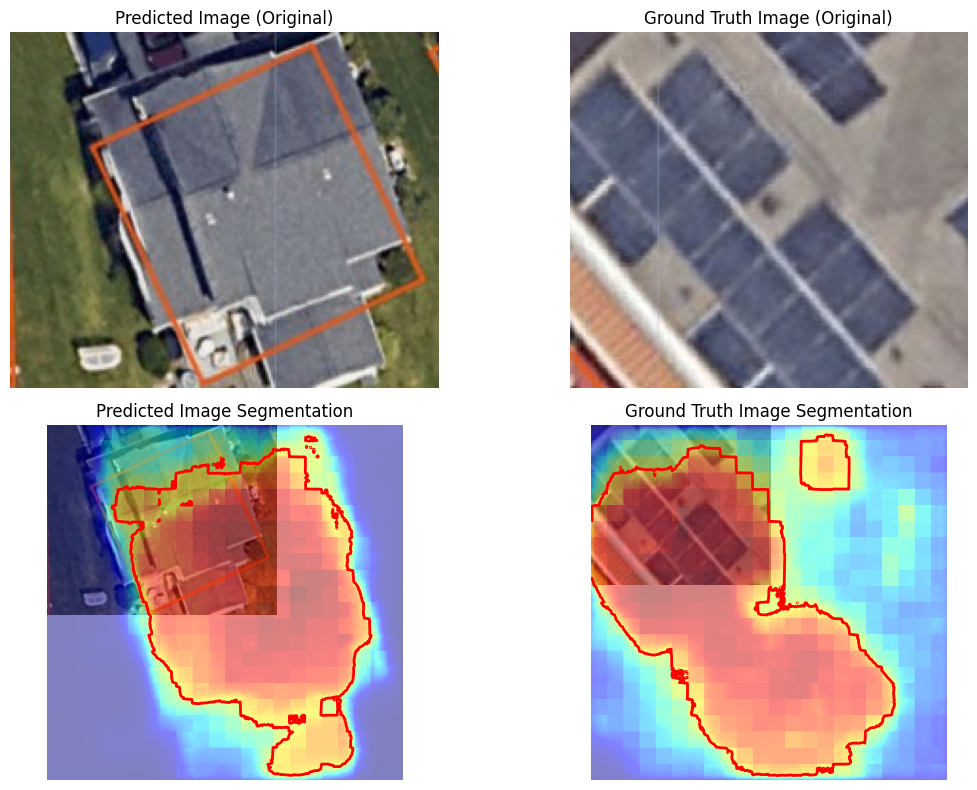

In [ ]:
import torch
from transformers import CLIPSegProcessor, CLIPSegForImageSegmentation
from PIL import Image
import matplotlib.pyplot as plt

# Load CLIPSeg model and processor
model = CLIPSegForImageSegmentation.from_pretrained("CIDAS/clipseg-rd64-refined")
processor = CLIPSegProcessor.from_pretrained("CIDAS/clipseg-rd64-refined")

# Load images (PIL format)
predicted_image = Image.open("/content/sp_sample1.jpg")
ground_truth_image = Image.open("/content/sp_true.jpg")

# Prompt for segmentation
prompt = "solar panel"

# Process the original images with CLIPSeg
def apply_clipseg(image, prompt, processor, model):
    inputs = processor(text=prompt, images=image, return_tensors="pt", padding=True)
    with torch.no_grad():
        outputs = model(**inputs)
    mask = torch.sigmoid(outputs.logits)  # Apply sigmoid to get probabilities
    return mask.squeeze(0).cpu().numpy()

predicted_mask = apply_clipseg(predicted_image, prompt, processor, model)
ground_truth_mask = apply_clipseg(ground_truth_image, prompt, processor, model)

# Plot original images and segmentation results
fig, ax = plt.subplots(2, 2, figsize=(12, 8))

# Predicted Image and Segmentation
ax[0, 0].imshow(predicted_image)
ax[0, 0].axis("off")
ax[0, 0].set_title("Predicted Image (Original)")

ax[1, 0].imshow(predicted_image)
ax[1, 0].imshow(predicted_mask, alpha=0.5, cmap="jet")  # Overlay segmentation mask
ax[1, 0].contour(predicted_mask, levels=[0.5], colors="red", linewidths=2)  # Add segmentation boundary
ax[1, 0].axis("off")
ax[1, 0].set_title("Predicted Image Segmentation")

# Ground Truth Image and Segmentation
ax[0, 1].imshow(ground_truth_image)
ax[0, 1].axis("off")
ax[0, 1].set_title("Ground Truth Image (Original)")

ax[1, 1].imshow(ground_truth_image)
ax[1, 1].imshow(ground_truth_mask, alpha=0.5, cmap="jet")  # Overlay segmentation mask
ax[1, 1].contour(ground_truth_mask, levels=[0.5], colors="red", linewidths=2)  # Add segmentation boundary
ax[1, 1].axis("off")
ax[1, 1].set_title("Ground Truth Image Segmentation")

plt.tight_layout()
plt.show()


In [ ]:
url = "https://i.imgur.com/mRSORqz.jpg"
alternative_prompt = Image.open(requests.get(url, stream=True).raw)
alternative_prompt


In [ ]:
encoded_alternative_prompt = processor(images=[alternative_prompt], return_tensors="pt")
# predict
with torch.no_grad():
  outputs = model(**encoded_image, conditional_pixel_values=encoded_alternative_prompt.pixel_values)
preds = outputs.logits.unsqueeze(1)
preds = torch.transpose(preds, 0, 1)

In [ ]:
_, ax = plt.subplots(1, 2, figsize=(6, 4))
[a.axis('off') for a in ax.flatten()]
ax[0].imshow(image)
ax[1].imshow(torch.sigmoid(preds[0]))

In this case, the result is pretty much the same. This is probably because the coffee cup was already separated well from the background in the original image.

# Using CLIPSeg to pre-label images on Segments.ai

As you can see, the results from CLIPSeg are a little fuzzy and very low-res. If we want to obtain better results, you can fine-tune a state-of-the-art segmentation model, as explained in [our previous blogpost](https://huggingface.co/blog/fine-tune-segformer). To finetune the model, we'll need labeled data. In this section, we'll show you how you can use CLIPSeg to create some rough segmentation masks and then refine them on [Segments.ai](https://segments.ai/?utm_source=hf&utm_medium=colab&utm_campaign=clipseg), the best labeling platform for image segmentation.  

First, create an account at [https://segments.ai/join](https://segments.ai/join?utm_source=hf&utm_medium=colab&utm_campaign=clipseg) and install the Segments Python SDK. Then you can initialize the Segments.ai Python client using an API key. This key can be found on [the account page](https://segments.ai/account).

In [ ]:
!pip install -q segments-ai

In [ ]:
from segments import SegmentsClient
from getpass import getpass

api_key = getpass('Enter your API key: ')
segments_client = SegmentsClient(api_key)

Next, let's load an image from a dataset using the Segments client. We'll use the [a2d2 self-driving dataset](https://www.a2d2.audi/a2d2/en.html). You can also create your own dataset by following [these instructions](https://docs.segments.ai/tutorials/getting-started).

In [ ]:
samples = segments_client.get_samples("admin-tobias/clipseg")

# Use the last image as an example
sample = samples[1]
image = Image.open(requests.get(sample.attributes.image.url, stream=True).raw)
image

We also need to get the category names from the dataset attributes.

In [ ]:
dataset = segments_client.get_dataset("admin-tobias/clipseg")
category_names = [category.name for category in dataset.task_attributes.categories]

Now we can use CLIPSeg on the image as before. This time, we'll also scale up the outputs so that they match the input image's size.

In [ ]:
from torch import nn

inputs = processor(text=category_names, images=[image] * len(category_names), padding="max_length", return_tensors="pt")

# predict
with torch.no_grad():
  outputs = model(**inputs)

# resize the outputs
preds = nn.functional.interpolate(
    outputs.logits.unsqueeze(1),
    size=(image.size[1], image.size[0]),
    mode="bilinear"
)

And we can visualize the results again.

In [ ]:
len_cats = len(category_names)
_, ax = plt.subplots(1, len_cats + 1, figsize=(3*(len_cats + 1), 4))
[a.axis('off') for a in ax.flatten()]
ax[0].imshow(image)
[ax[i+1].imshow(torch.sigmoid(preds[i][0])) for i in range(len_cats)];
[ax[i+1].text(0, -15, category_name) for i, category_name in enumerate(category_names)];

Now we have to combine the predictions to a single segmentated image. We'll simply do this by taking the category with the greatest sigmoid value for each patch. We'll also make sure that all the values under a certain threshold do not count.

In [ ]:
threshold = 0.1

flat_preds = torch.sigmoid(preds.squeeze()).reshape((preds.shape[0], -1))

# Initialize a dummy "unlabeled" mask with the threshold
flat_preds_with_treshold = torch.full((preds.shape[0] + 1, flat_preds.shape[-1]), threshold)
flat_preds_with_treshold[1:preds.shape[0]+1,:] = flat_preds

# Get the top mask index for each pixel
inds = torch.topk(flat_preds_with_treshold, 1, dim=0).indices.reshape((preds.shape[-2], preds.shape[-1]))

Let's quickly visualize the result.

In [ ]:
plt.imshow(inds)

Lastly, we can upload the prediction to Segments.ai. To do that, we'll first convert the bitmap to a png file, then we'll upload this file to the Segments, and finally we'll add the label to the sample.

In [ ]:
from segments.utils import bitmap2file
import numpy as np

inds_np = inds.numpy().astype(np.uint32)
unique_inds = np.unique(inds_np).tolist()
f = bitmap2file(inds_np, is_segmentation_bitmap=True)

asset = segments_client.upload_asset(f, "clipseg_prediction.png")

attributes = {
      'format_version': '0.1',
      'annotations': [{"id": i, "category_id": i} for i in unique_inds if i != 0],
      'segmentation_bitmap': { 'url': asset.url },
  }

segments_client.add_label(sample.uuid, 'ground-truth', attributes)

If you take a look at the [uploaded prediction on Segments.ai](https://segments.ai/admin-tobias/clipseg/samples/71a80d39-8cf3-4768-a097-e81e0b677517/ground-truth), you can see that it's not perfect. However, you can manually correct the biggest mistakes, and then you can use the corrected dataset to train a better model than CLIPSeg.